In [ ]:
from logging import DEBUG
from google.colab import files
import os

DEBUG = False


In [ ]:
# Upload files from local machine
uploaded = files.upload()

# Google Drive colab root directory
#  |
#  ├──misure.zip (compressed file with all tests done, it contains a misure folder and inside the other folders)
#  |   └─misure
#  |       ├──bare-metal
#  |       |   ├──exp_t_20
#  |       |   ├──ebpf_30
#  |       |   ├──confronto_clab
#  |       |   ├──run_30
#  |       |   └──test_redone
#  |       ├──vm
#  |       |   └──exp_t_20
#  |       └──mazinga
#  |           └──exp_t_20
#  |
#  ├──bare-metal (test made in bare metal server on cloudlab)
#  |   ├──exp_t_20 (test made with TX duration time of 20 sec.)
#  |   ├──ebpf_30 (test made with ebpf forwarding on SUT)
#  |   ├──confronto_clab (comparative tests for three testbeds instantiated on cloudlab, plus tb3 with old kernels)
#  |   ├──run_30 (test made with 30 execution e TX duration of 6 sec. and 10 sec.)
#  |   └──test_redone (some tests rexecuted)
#  |
#  ├──vm (test made in cloudlab with virtual machine)
#  |   └──exp_t_20 (test made with TX duration time of 20 sec.)
#  |
#  └──mazinga (test made in local server (mazinga) with netns)
#      └──exp_t_20 (test made with TX duration time of 20 sec.)

Saving misure.zip to misure.zip


In [ ]:
# UNZIP THE FILES

import zipfile
import io

for fn in uploaded.keys():
  if fn.endswith('.zip'):
    with zipfile.ZipFile(io.BytesIO(uploaded[fn]), 'r') as zip_ref:
      zip_ref.extractall('.')
      print(f'File {fn} extracted.')

File misure.zip extracted.


In [ ]:
# DISPLAYS THE FILES in the misure folder

def display_txt_files(folder_path):
  print (f"display the files in folder: {folder_path}")
  count = 0
  # Get a list of all files in the folder
  if folder_path == '':
    folder_path = os.getcwd()
    print(f"current folder changed to: {folder_path}")
  my_files_list = os.listdir(folder_path)
  #for all files
  for file in my_files_list:
    #check if file is a txt file
    if file.endswith(".txt"):
      count += 1
      print(f"folder: {folder_path} file: {my_files_list}")

    #chect if file is a folder
    my_path = folder_path+'/'+file
    if os.path.isdir(my_path):
      print(f"{my_path} is a folder")
      #recurse display_txt_file in the folder
      count += display_txt_files(my_path)
  return count

folder_path = 'misure'
count = display_txt_files(folder_path)

print("Number of .txt files:", count)

display the files in folder: misure
misure/vm is a folder
display the files in folder: misure/vm
folder: misure/vm file: ['clab_raw_50_k5.15_intel_vm_nic_buf_4096.txt', 'clab_raw_50_k6.5_intel_vm_as-is.txt', 'clab_raw_50_k6.5_intel_vm_nic_buf_4096_irq_pf0-1_pf1-2.txt', 'clab_raw_50_k5.15_intel_vm_nic_buf_4096_2nd_exec.txt', 'clab_raw_50_k5.15_intel_vm_nic_buf_4096_irq_pf0-1_pf1-1.txt', 'clab_raw_50_k5.15_intel_vm_as-is.txt', 'clab_raw_50_k6.8_intel_vm_nic_buf_4096_irq_pf0-1_pf1-1.txt', 'clab_raw_50_k6.8_intel_vm_nic_buf_4096.txt', 'clab_raw_50_k5.15_intel_vm_nic_buf_4096_irq_pf0-1_pf1-2.txt', 'exp_t_20', 'clab_raw_50_k6.5_intel_vm_nic_buf_4096_irq_pf0-1_pf1-1.txt', 'clab_raw_50_k6.5_intel_vm_nic_buf_4096.txt', 'clab_raw_50_k6.8_intel_vm_nic_buf_4096_irq_pf0-1_pf1-2.txt', 'clab_raw_50_k6.8_intel_vm_as-is.txt']
folder: misure/vm file: ['clab_raw_50_k5.15_intel_vm_nic_buf_4096.txt', 'clab_raw_50_k6.5_intel_vm_as-is.txt', 'clab_raw_50_k6.5_intel_vm_nic_buf_4096_irq_pf0-1_pf1-2.txt', 'clab_

In [ ]:
# LOADS THE FILES from the misure folder

files = []

def add_txt_files(folder_path):
  print (f"display the files in folder: {folder_path}")
  count = 0
  # Get a list of all files in the folder
  if folder_path == '':
    folder_path = os.getcwd()
    print(f"current folder changed to: {folder_path}")
  my_files = os.listdir(folder_path)
  #for all files
  for file in my_files:
    my_path = folder_path+'/'+file
    #check if file is a txt file
    if file.endswith(".txt"):
      count += 1
      print(f"folder: {folder_path} file: {file}")
      files.append(my_path)

    #check if file is a folder

    if os.path.isdir(my_path):
      print(f"{my_path} is a folder")
      #recurse display_txt_file in the folder
      count += add_txt_files(my_path)
  return count

folder_path = 'misure'
count = add_txt_files(folder_path)

print("Number of .txt files:", count)
print(files)

display the files in folder: misure
misure/vm is a folder
display the files in folder: misure/vm
folder: misure/vm file: clab_raw_50_k5.15_intel_vm_nic_buf_4096.txt
folder: misure/vm file: clab_raw_50_k6.5_intel_vm_as-is.txt
folder: misure/vm file: clab_raw_50_k6.5_intel_vm_nic_buf_4096_irq_pf0-1_pf1-2.txt
folder: misure/vm file: clab_raw_50_k5.15_intel_vm_nic_buf_4096_2nd_exec.txt
folder: misure/vm file: clab_raw_50_k5.15_intel_vm_nic_buf_4096_irq_pf0-1_pf1-1.txt
folder: misure/vm file: clab_raw_50_k5.15_intel_vm_as-is.txt
folder: misure/vm file: clab_raw_50_k6.8_intel_vm_nic_buf_4096_irq_pf0-1_pf1-1.txt
folder: misure/vm file: clab_raw_50_k6.8_intel_vm_nic_buf_4096.txt
folder: misure/vm file: clab_raw_50_k5.15_intel_vm_nic_buf_4096_irq_pf0-1_pf1-2.txt
misure/vm/exp_t_20 is a folder
display the files in folder: misure/vm/exp_t_20
folder: misure/vm/exp_t_20 file: clab_raw_50_exp_t_20_k5.15_intel_vm_nic_buf_4096_irq_pf0-1_pf1-2.txt
folder: misure/vm/exp_t_20 file: clab_raw_50_exp_t_20_k

In [ ]:
# DELETE ALL .txt FILES

folder_path = ''

files = os.listdir()

print("Files in folder:", files)

#delete all files ending with .txt
for filetxt in files:
  if filetxt.endswith(".txt"):
    os.remove(filetxt)  # remove the file

Files in folder: ['.config', 'mazinga', 'bare metal', 'misure', 'misure.zip', 'misure (1).zip', 'vm', 'sample_data']


In [ ]:
# DELETE ALL .zip FILES in main folder and the misure folder

files = os.listdir()

print("Files in folder:", files)

#delete all files ending with .zip
for filezip in files:
  if filezip.endswith(".zip"):
    print(f"removing: {filezip}")
    os.remove(filezip)  # remove the file

# delete the folder misure and all its content recursively
!rm -rf misure

# delete the folder misure and all its content recursively
!rm -rf graphs

Files in folder: ['.config', 'misure.zip', 'misure', 'sample_data']
removing: misure.zip


In [ ]:
# List some folders

my_files_list = os.listdir()

print("Files in main folder:", my_files_list)

my_folder = 'misure'
#check if my_folder exists and if it is a folder
if os.path.exists(my_folder) and os.path.isdir(my_folder):
  my_files_list = os.listdir(my_folder)
  print(f"Files in folder {my_folder}: {my_files_list}")
else:
  print(f"{my_folder} does not exist or is not a folder")



Files in main folder: ['.config', 'misure', 'misure.zip', 'sample_data']
Files in folder misure: ['vm', 'mazinga', 'bare-metal']


In [ ]:
# PROCESS FILES AND CREATES exp_data list
#[[rate, start_rx_discards], [tx_pkt, rx_pkt, rx_discards], [tx_pkt, rx_pkt, rx_discards], ... [tx_pkt, rx_pkt, rx_discards]]

#parse experiment file
import json, re
import numpy as np

#NUM_OF_EXPERIMENTS = 50.0

def create_title(txtname):
  """
  Create a title string based on the filename.
  """
  # Initialize the title string
  title = ""

  if "class_ebpf" in txtname:
    title += "ebpf, "
  elif "class_routing" in txtname:
    title += "routing, "
  else:
    title += "routing, "

  if "clab" in txtname:
    title += "CloudLab, "
  elif "mazinga" in txtname:
    title += "mazinga loc srv, "

  if "bare-metal" in txtname:
    title += "bare metal server, "
  elif "vm" in txtname:
    title += "virtual machine, "
  elif "ns" in txtname:
    title += "container, "

  if "tb1" in txtname:
    title += "Testbed 1, "
  elif "tb2" in txtname:
    title += "Testbed 2, "
  elif "tb3" in txtname:
    title += "Testbed 3, "
  else:
    title += "Testbed 0, "

  if "raw_30" in txtname:
    title += "30 runs, "
  elif "raw_50" in txtname:
    title += "50 runs, "
  elif "ebpf_30_" in txtname:  #TODO REMOVE THIS PATCH
    title += "30 runs, "

  if "exp_t_6" in txtname:
    title += "T = 6s, "
  elif "exp_t_20" in txtname:
    title += "T = 20s, "
  elif "exp_t_10" in txtname:
    title += "T = 10s, "
  else:
    title += "T = 10s, "

#  if "multi_t_10" in txtname:
#    title += "multi thread, "

  if "k5.6" in txtname:
    title += "kernel 5.6, "
  elif "k5.15" in txtname:
    title += "kernel 5.15, "
  elif "k5.18" in txtname:
    title += "kernel 5.18, "
  elif "k5.12" in txtname:
    title += "kernel 5.12, "
  elif "k5.13" in txtname:
    title += "kernel 5.13, "
  elif "k6.5" in txtname:
    title += "kernel 6.5, "
  elif "k6.8" in txtname:
    title += "kernel 6.8, "

  if not "_irq" in txtname:
    title += "unpinned, "
  else:
    if "pf0-4" in txtname and "pf1-4" in txtname:
      title += "pin-1cpu, "
    elif "pf0-4" in txtname and "pf1-6" in txtname:
      title += "pin-2cpu, "
    elif "pf0-1" in txtname and "pf1-1" in txtname:
      title += "pin-1cpu, "
    elif "pf0-1" in txtname and "pf1-2" in txtname:
      title += "pin-2cpu, "
    elif "vf0-33" in txtname and "vf1-33" in txtname:
      title += "pin-1cpu, "
    elif "vf0-33" in txtname and "vf1-35" in txtname:
      title += "pin-2cpu, "

  if "nic_buf_4096" in txtname:
    title += "LARGE nic buffer, "
  else:
    title += "SMALL nic buffer, "

  if "date" in txtname:
    title += "date %s, " % re.search(r'date_(\d{4}-\d{2}-\d{2})', txtname).group(1)
  else:
    title += "date 0000-00-00, "
  if "ver" in txtname:
    title += "version %s, " % re.search(r'ver_(\d{2})', txtname).group(1)
  else:
    title += "version 00, "


  return title[:-2]

# Initialize an empty list to hold the JSON arrays

exp_data = []

for filetxt in files:
  if filetxt.endswith(".txt"):
    print("\n>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
    print(filetxt)
    suptitle = create_title(filetxt)
    print(suptitle)

    experiments = []
    # Open the file in read mode
    with open(filetxt, 'r') as file:
        print(f"file openend: {filetxt}")

        # Iterate through each line in the file
        line_count = 0
        for line in file:
            # Strip any whitespace or newline characters
            line = line.strip()
            if DEBUG:
              print('line', line_count)
            line_count += 1
            # Parse the JSON array and append it to the list
            if line:  # Check if the line is not empty
                experiment = json.loads(line)  # Parse the JSON
                experiments.append(experiment)  # Add it to the list

    # Now you have a list of JSON arrays
    #print(experiments)

    rate_list = []
    drop_pkt_mean_list = []
    drop_pkt_std_list = []
    rxdis_pkt_mean_list = []
    rxdis_pkt_std_list = []
    other_loss_mean_list = []
    other_loss_std_list = []
    cv_drop_pkt_list = []
    cv_rxdis_pkt_list = []
    cv_other_loss_list = []
    drop_ratio_mean_list = []
    drop_ratio_std_list = []
    cv_drop_ratio_list = []
    delivery_ratio_mean_list = []
    delivery_ratio_std_list = []
    cv_delivery_ratio_list = []
    num_of_experiments_list = []


    # Iterate over the list of experiments
    for experiment in experiments:
        #print(experiment)

        # Extract the first element
        first_element = experiment[0]
        rate = first_element[0]
        rx_disc = first_element[1]



        # Initialize a list to hold the differences
        diff_txrx_list = []
        diff_rxdis_list = []
        other_loss_list = []
        delivery_ratio_list = []
        drop_ratio_list = []
        rxdis_ratio_list = []
        loss_ratio_list = []


        # Calculate the difference for each of the remaining elements
        for exp_run in experiment[1:]:
            tx_pkt = exp_run[0]
            rx_pkt = exp_run[1]
            rx_discards = exp_run[2]

            diff_txrx = tx_pkt - rx_pkt + 7
            diff_rxdis = rx_discards - rx_disc
            other_loss = diff_txrx - diff_rxdis

            delivery_ratio = rx_pkt / tx_pkt
            drop_ratio = 1 - delivery_ratio
            rxdis_ratio = diff_rxdis / tx_pkt
            loss_ratio = other_loss / tx_pkt


            diff_txrx_list.append(diff_txrx)
            diff_rxdis_list.append(diff_rxdis)
            other_loss_list.append(other_loss)
            delivery_ratio_list.append(delivery_ratio)
            drop_ratio_list.append(drop_ratio)
            rxdis_ratio_list.append(rxdis_ratio)
            loss_ratio_list.append(loss_ratio)

            rx_disc = rx_discards

        if DEBUG:
          # Print the differences
          print("################")
          print("Experiment Rate: %d pps" % rate)
          #print("Drop Packets:", diff_txrx_list)
          #print("rx_discard Packets:", diff_rxdis_list)
          #print("Other Loss:", other_loss_list)
          #print("Delivery Ratio:", delivery_ratio_list)
          #print("Drop Ratio:", drop_ratio_list)
          #print("Discard Ratio:", rxdis_ratio_list)
          #print("Loss Ratio:", loss_ratio_list)

        drop_pkt_mean = np.mean(diff_txrx_list)
        drop_pkt_std = np.std(diff_txrx_list, ddof=1)
        rxdis_pkt_mean = np.mean(diff_rxdis_list)
        rxdis_pkt_std = np.std(diff_rxdis_list, ddof=1)
        other_loss_mean = np.mean(other_loss_list)
        other_loss_std = np.std(other_loss_list, ddof=1)
        if drop_pkt_mean == 0:
            cv_drop_pkt = 0
        else:
            cv_drop_pkt = drop_pkt_std / drop_pkt_mean
        if rxdis_pkt_mean == 0:
            cv_rxdis_pkt = 0
        else:
            cv_rxdis_pkt = rxdis_pkt_std / rxdis_pkt_mean
        if other_loss_mean == 0:
            cv_other_loss = 0
        else:
            cv_other_loss = other_loss_std / other_loss_mean

        drop_ratio_mean = max(np.mean(drop_ratio_list), 1e-6)
        drop_ratio_std = np.std(drop_ratio_list, ddof=1)
        if drop_ratio_mean == 0:
            cv_drop_ratio = 0
        else:
            cv_drop_ratio = drop_ratio_std / drop_ratio_mean

        delivery_ratio_mean = np.mean(delivery_ratio_list)
        delivery_ratio_std = np.std(delivery_ratio_list, ddof=1)
        if delivery_ratio_mean == 0:
            cv_delivery_ratio = 0
        else:
            cv_delivery_ratio = delivery_ratio_std / delivery_ratio_mean

        num_of_experiments = len(experiment)-1

        if DEBUG:
          print("\nDrop Packets Mean:", drop_pkt_mean)
          print("Drop Packets Std:", drop_pkt_std)
          print("Drop Ratio CV:", cv_drop_pkt)
          print("Delivery Ratio Mean:", delivery_ratio_mean)
          print("Delivery Ratio Std:", delivery_ratio_std)
          print("Drop Ratio Mean:", drop_ratio_mean)
          print("Drop Ratio Std:", drop_ratio_std)
          print("rx_discard Packets Mean:", rxdis_pkt_mean)
          print("rx_discard Packets Std:", rxdis_pkt_std)
          print("rx_discard Ratio CV:", cv_rxdis_pkt)
          print("Other Loss Mean:", other_loss_mean)
          print("Other Loss Std:", other_loss_std)
          print("Loss Ratio CV:", cv_other_loss)
          print("\n")

        rate_list.append(rate)
        drop_pkt_mean_list.append(drop_pkt_mean)
        drop_pkt_std_list.append(drop_pkt_std)
        rxdis_pkt_mean_list.append(rxdis_pkt_mean)
        rxdis_pkt_std_list.append(rxdis_pkt_std)
        other_loss_mean_list.append(other_loss_mean)
        other_loss_std_list.append(other_loss_std)
        cv_drop_pkt_list.append(cv_drop_pkt)
        cv_rxdis_pkt_list.append(cv_rxdis_pkt)
        cv_other_loss_list.append(cv_other_loss)
        delivery_ratio_mean_list.append(delivery_ratio_mean)
        delivery_ratio_std_list.append(delivery_ratio_std)
        cv_delivery_ratio_list.append(cv_delivery_ratio)
        drop_ratio_mean_list.append(drop_ratio_mean)
        drop_ratio_std_list.append(drop_ratio_std)
        cv_drop_ratio_list.append(cv_drop_ratio)
        num_of_experiments_list.append(num_of_experiments)

    exp_data.append([suptitle, filetxt, rate_list, cv_drop_pkt_list,
                     drop_ratio_mean_list, drop_ratio_std_list, cv_drop_ratio_list,
                     delivery_ratio_mean_list, delivery_ratio_std_list, cv_delivery_ratio_list,
                     num_of_experiments_list])
    print(exp_data)



>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
misure/vm/clab_raw_50_k5.15_intel_vm_nic_buf_4096.txt
routing, CloudLab, virtual machine, Testbed 0, 50 runs, T = 10s, kernel 5.15, unpinned, LARGE nic buffer, date 0000-00-00, version 00
file openend: misure/vm/clab_raw_50_k5.15_intel_vm_nic_buf_4096.txt
[['routing, CloudLab, virtual machine, Testbed 0, 50 runs, T = 10s, kernel 5.15, unpinned, LARGE nic buffer, date 0000-00-00, version 00', 'misure/vm/clab_raw_50_k5.15_intel_vm_nic_buf_4096.txt', [300000, 450000, 600000, 750000, 900000, 1050000, 1200000, 1350000, 1500000], [0.07406561200574238, 0.07302307550979838, 0.5386104365685588, 0.14202872857740206, 0.3241867594303366, 0.185509714027926, 0.3633955144951001, 0.12756242436272666, 0.08018807499012917], [1e-06, 1e-06, 0.00043071820534081875, 0.0017460297989412843, 0.005354777340481331, 0.014168077775089945, 0.06291149644472285, 0.17151533723790163, 0.2526031215343738], [1.634381716180115e-07, 1.0774962874036569e-

In [ ]:
# SORTS and FILTER exp_data

#CloudLab, bare metal server, Testbed 3, 50 runs, T = 10s, kernel 5.12, unpinned, SMALL nic buffer

#exp_split[0] : class, can be "routing" or "ebpf",
#exp_split[1] : location, can be "Cloudlab",
#exp_split[2] : type, can be "bare metal server",
#exp_split[3] : testbed_instance, can be "Testbed 3",
#exp_split[4] : runs (number of runs)
#exp_split[5] : duration (duration of each run)
#exp_split[6] : kernel
#exp_split[7] : cpu_pinning
#exp_split[8] : nic_buffer
#exp_split[9] : date
#exp_split[10] : version



#define the list of possible experiment classes
CLASS_LIST = ["ebpf",
              "routing",
              ]

#define the list of possible locations
LOCATION_LIST = ["CloudLab",
                 "mazinga loc srv",
                 ]

#define the list of possible types
TYPE_LIST = ["bare metal server",
             "virtual machine",
             "container",
             ]

#define the list of possible testbed instances
TESTBED_LIST = ["Testbed 0",
               "Testbed 1",
               "Testbed 2",
               "Testbed 3",
               ]

#define the list of possible number of runs
RUNS_LIST = ["30 runs",
             "50 runs",
             ]

#define the list of possible durations
DURATION_LIST = ["T = 6s",
                 "T = 10s",
                 "T = 20s",
                ]

#define the list of possible kernel values
KERNEL_LIST = ["kernel 5.6",
               "kernel 5.12",
               "kernel 5.13",
               "kernel 5.15",
               "kernel 5.18",
               "kernel 6.5",
               "kernel 6.8",
               ]

#define the list of possible cpu_pinning modes
CPU_PINNING_LIST = ["unpinned",
                    "pin-1cpu",
                    "pin-2cpu",
                    ]

#define the list of possible nic_buffer values
NIC_BUFFER_LIST = ["SMALL nic buffer",
                   "LARGE nic buffer",
                   ]

def kernel_order(s):
  """return the order of the kernel s given in input or -1 if s is not in KERNEL_LIST"""
  if s in KERNEL_LIST:
    return KERNEL_LIST.index(s)
  else:
    return -1

def cpu_pinning_order(s):
  """return the order of the cpu_pinning mode s given in input or -1 if s is not in CPU_PINNING_LIST"""
  if s in CPU_PINNING_LIST:
    return CPU_PINNING_LIST.index(s)
  else:
    return -1

def buffer_size_order(s):
  """return the order of the nic_buffer size s given in input or -1 if s is not in NIC_BUFFER_LIST"""
  if s in NIC_BUFFER_LIST:
    return NIC_BUFFER_LIST.index(s)
  else:
    return -1

column_names = ["class",
                "location",
                "type",
                "testbed",
                "runs",
                "duration",
                "kernel",
                "cpu_pinning",
                "nic_buffer",
                "date",
                "version",
                ]

#find the column_index associated with column_name
def get_column_index(column_name):
  """return the index of the column given in input or -1 if column_name is not in column_names"""
  if column_name not in column_names:
    return -1
  return column_names.index(column_name)

#find the column_name associated with column_index
def get_column_name(column_index):
  """return the name of the column given in input or raise exception if column_index is not in column_names"""
  if column_index < 0 or column_index >= len(column_names):
    raise ValueError("column_index out of range")
  return column_names[column_index]

#DO NOT EDIT THESE DEFINITION WHICH ARE LEFT FOR REFERENCE
include_filter = {'class':[],
                  'location':[],
                  'type':[],
                  'testbed':[],
                  'runs':[],
                  'duration':[],
                  'kernel':[],
                  'cpu_pinning':[],
                  'nic_buffer':[],
                  'date':[],
                  'version':[],
                  }

exclude_filter = {'class':[],
                  'location':[],
                  'type':[],
                  'testbed':[],
                  'runs':[],
                  'duration':[],
                  'kernel':[],
                  'cpu_pinning':[],
                  'nic_buffer':[],
                  'date':[],
                  'version':[],
                  }
#END DO NOT EDIT

#EDIT THE FOLLOWING INCLUDE AND EXCLUDE FILTER AS NEEDED

# include_filter = {'class':[],
#                   'location':["CloudLab"],
#                   'type':["bare metal server"],
#                   'testbed':["Testbed 0"],
#                   'runs':[],
#                   'duration':["T = 10s"],
#                   'kernel':["kernel 6.5", "kernel 6.8"],
#                   'cpu_pinning':["pin-1cpu"],
#                   'nic_buffer':["LARGE nic buffer"],
#                   'date':[],
#                   'version':["version 02"],
#                   }

include_filter = {'class':[],
                  'location':[],
                  'type':[],
                  'testbed':[],
                  'runs':[],
                  'duration':[],
                  'kernel':[],
                  'cpu_pinning':[],
                  'nic_buffer':[],
                  'date':[],
                  'version':[],
                  }

# exclude_filter = {'class':["ebpf"],
#                  'location':[],
#                  'type':[],
#                  'testbed':[],
#                  'runs':[],
#                  'duration':[],
#                  'kernel':[],
#                  'cpu_pinning':[],
#                  'nic_buffer':[],
#                  'date':[],
#                  'version':[],
#                  }
#END EDIT FILTERS

def filter_exp(exp_split, include_filter, exclude_filter):
  """return True if the experiment given in input matches the filter given in input"""

  for key in include_filter:
    if include_filter[key] == []:
      if exclude_filter[key] == []:
        continue #return True
      else:
        # we have only exlude filter for this key
        if exp_split[get_column_index(key)] not in exclude_filter[key]:
          continue #return True
        else:
          return False
    else:
      # we have include filter
      if exclude_filter[key] == []:
        #we have only include filter
        if exp_split[get_column_index(key)] not in include_filter[key]:
          return False
        else:
          continue #return True
      else:
        # we have both include and exclude filter
        if exp_split[get_column_index(key)] not in include_filter[key]:
          return False
        else:
          if exp_split[get_column_index(key)] in exclude_filter[key]:
            return False
          else:
            continue #return True
  return True

#filter the exp_data based on the filter given in input
exp_data_filtered = []
for exp in exp_data:
  print(exp[0])
  exp_split = exp[0].split(", ")
  print(exp_split)
  if filter_exp (exp_split, include_filter, exclude_filter):
    exp_data_filtered.append(exp)

# sort the exp based on title, parsing the title as a list
# use the default sort for the first 5 elements of the list
# use a custom sorting order on the sixt element of the list
# provided with a function called cpu_pinning_order
# use a custom sorting order on the seventh element of the list
# provided with a function called buffer_size_order
count = 0
for exp in exp_data_filtered:
  print(count, exp[0])
  print(count, exp[1])
  #print the length of exp[0].split(", ")
  num_columns = len(exp[0].split(", "))
  print(num_columns)
  if (num_columns != len(column_names)):
    print(f"ERROR: number of columns is not {len(column_names)}")
    print(exp[0])
    raise ValueError(f"number of columns is not {len(column_names)}")
  print()
  count += 1

exp_data_filtered.sort(key=lambda x: (x[0].split(", ")[:6],  # from 0 to 5
                             kernel_order(x[0].split(", ")[6]),
                             cpu_pinning_order(x[0].split(", ")[7]),
                             buffer_size_order(x[0].split(", ")[8]),
                             x[0].split(", ")[9],
                             x[0].split(", ")[10],
                             )
                      )



#prints a separator line
print("\n>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")

for exp in exp_data_filtered:
  print(exp)
  print(len(exp))




routing, CloudLab, virtual machine, Testbed 0, 50 runs, T = 10s, kernel 5.15, unpinned, LARGE nic buffer, date 0000-00-00, version 00
['routing', 'CloudLab', 'virtual machine', 'Testbed 0', '50 runs', 'T = 10s', 'kernel 5.15', 'unpinned', 'LARGE nic buffer', 'date 0000-00-00', 'version 00']
routing, CloudLab, virtual machine, Testbed 0, 50 runs, T = 10s, kernel 6.5, unpinned, SMALL nic buffer, date 0000-00-00, version 00
['routing', 'CloudLab', 'virtual machine', 'Testbed 0', '50 runs', 'T = 10s', 'kernel 6.5', 'unpinned', 'SMALL nic buffer', 'date 0000-00-00', 'version 00']
routing, CloudLab, virtual machine, Testbed 0, 50 runs, T = 10s, kernel 6.5, pin-2cpu, LARGE nic buffer, date 0000-00-00, version 00
['routing', 'CloudLab', 'virtual machine', 'Testbed 0', '50 runs', 'T = 10s', 'kernel 6.5', 'pin-2cpu', 'LARGE nic buffer', 'date 0000-00-00', 'version 00']
routing, CloudLab, virtual machine, Testbed 0, 50 runs, T = 10s, kernel 5.15, unpinned, LARGE nic buffer, date 0000-00-00, versi

[['ebpf, CloudLab, bare metal server, Testbed 1, 30 runs, T = 10s, kernel 5.15, unpinned, SMALL nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/ebpf_30/clab_tb1_raw_class_ebpf_30_exp_t_10_k5.15_intel_bare-metal_as-is.txt', [4000000, 4400000, 4800000, 5200000, 5600000, 6000000, 6400000, 6800000, 7200000, 7600000, 8000000, 8400000, 8800000, 9200000, 9600000, 10000000], [0.7610358577788202, 0.4651897508684348, 0.6168884365560753, 0.43498025505033727, 0.7332641734824877, 0.795162615355242, 0.8698462545765484, 0.9698644506633611, 0.13268153320581957, 0.052066289965500764, 0.05843406369467348, 0.16737792536287827, 0.21007580808941131, 0.9717511211334702, 0.4337087398933696, 0.12471491288740764], [0.00043788500000000824, 0.0014419726617285152, 0.0012937812769537797, 0.0014417646881372556, 0.001200329123797772, 0.0013474215768385588, 0.0013939777784138907, 0.0011862326163575001, 0.010049820826413773, 0.038067724187635814, 0.05378577839462606, 0.02726268289708477, 0.022401372067415

<Figure size 800x2000 with 0 Axes>

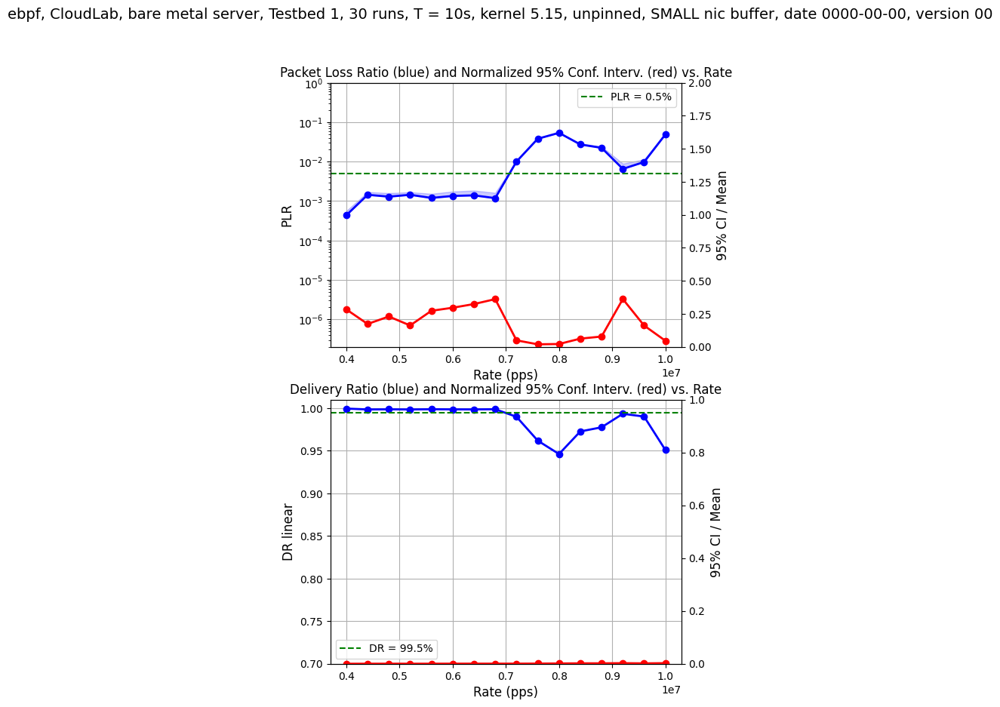

['ebpf, CloudLab, bare metal server, Testbed 1, 30 runs, T = 10s, kernel 5.15, unpinned, LARGE nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/ebpf_30/clab_tb1_raw_class_ebpf_30_exp_t_10_k5.15_intel_bare-metal_nic_buf_4096.txt', [4000000, 4400000, 4800000, 5200000, 5600000, 6000000, 6400000, 6800000, 7200000, 7600000, 8000000, 8400000, 8800000, 9200000, 9600000, 10000000], [3.3427238543487587, 0.7450456279543546, 0.5441017587720226, 0.8416493055349477, 0.6287715136174612, 0.5850353387647037, 0.5900411477164674, 0.06660762482867934, 0.05528509959182946, 0.35696704859303596, 0.6663862527257308, 0.8299898172705332, 0.18904016222333758, 0.06435449909202863, 0.047490099322738184, 0.022985529859527294], [0.07657500468499906, 0.0008944158684356495, 0.0015036099781137477, 0.0009431789549821897, 0.0016004683715791187, 0.0023722285685206326, 0.0025307440539039106, 0.029815011456934094, 0.047568657985848944, 0.01176928284277592, 0.007861950231693792, 0.005621689175483691, 0.023986831

<Figure size 800x2000 with 0 Axes>

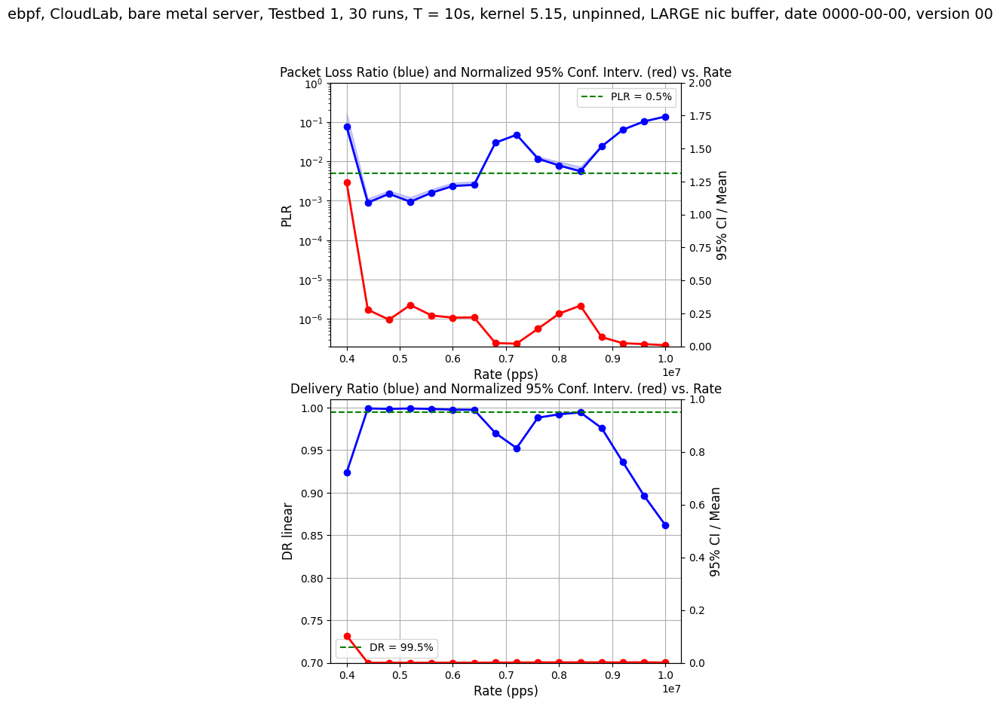

['ebpf, CloudLab, bare metal server, Testbed 1, 30 runs, T = 10s, kernel 5.15, pin-1cpu, LARGE nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/ebpf_30/clab_tb1_raw_class_ebpf_30_exp_t_10_k5.15_intel_bare-metal_nic_buf_4096_irq_pf0-4_pf1-4.txt', [4000000, 4400000, 4800000, 5200000, 5600000, 6000000, 6400000, 6800000, 7200000, 7600000, 8000000, 8400000, 8800000, 9200000, 9600000, 10000000], [0.43347239017884986, 0.6997863224201462, 0.7360048415968798, 0.49495634994918924, 0.5893068693007438, 0.5402794954315284, 0.7022839042053229, 0.07386481536637936, 0.057271837822502066, 0.33058240004007905, 0.7622088714062762, 0.7156253184733481, 0.1727219549819508, 0.0714896505869696, 0.049727875903905594, 0.040493453783647035], [0.0011922303874748721, 0.0012127483887718522, 0.0010794955184804703, 0.0017219001986807814, 0.0020748173335722467, 0.0022666385333239576, 0.005213139563677912, 0.035414548131532456, 0.047068493004312484, 0.012574559972183859, 0.005519669817235247, 0.008153301527

<Figure size 800x2000 with 0 Axes>

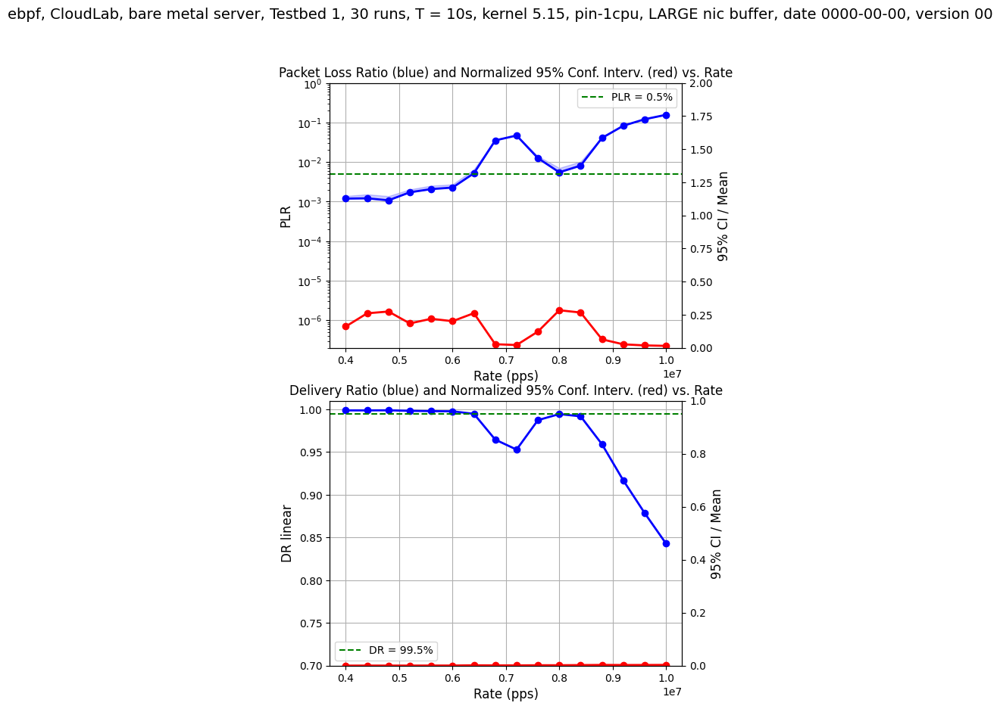

['ebpf, CloudLab, bare metal server, Testbed 1, 30 runs, T = 10s, kernel 5.15, pin-2cpu, LARGE nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/ebpf_30/clab_tb1_raw_class_ebpf_30_exp_t_10_k5.15_intel_bare-metal_nic_buf_4096_irq_pf0-4_pf1-6.txt', [4000000, 4400000, 4800000, 5200000, 5600000, 6000000, 6400000, 6800000, 7200000, 7600000, 8000000, 8400000, 8800000, 9200000, 9600000, 10000000], [0.9593333426120744, 0.7072432361721676, 0.5427256874380828, 0.5613295643872503, 0.5351028140808164, 0.2705787283539464, 0.1446163678321439, 0.2612663985255352, 0.6906970641531263, 0.39615503345160435, 0.14794119799841138, 0.05281520930974968, 0.05501400055428331, 0.06833689845276147, 0.059510702176668984, 0.03706183480969727], [0.00034959057988017685, 0.0008407231858490091, 0.0014221888629309916, 0.0014115008038911192, 0.002210912393675953, 0.027002049000683, 0.05395281704877874, 0.036527584438012774, 0.0065504037903497125, 0.01653278597548181, 0.0628271273190051, 0.11017480815350747, 0.

<Figure size 800x2000 with 0 Axes>

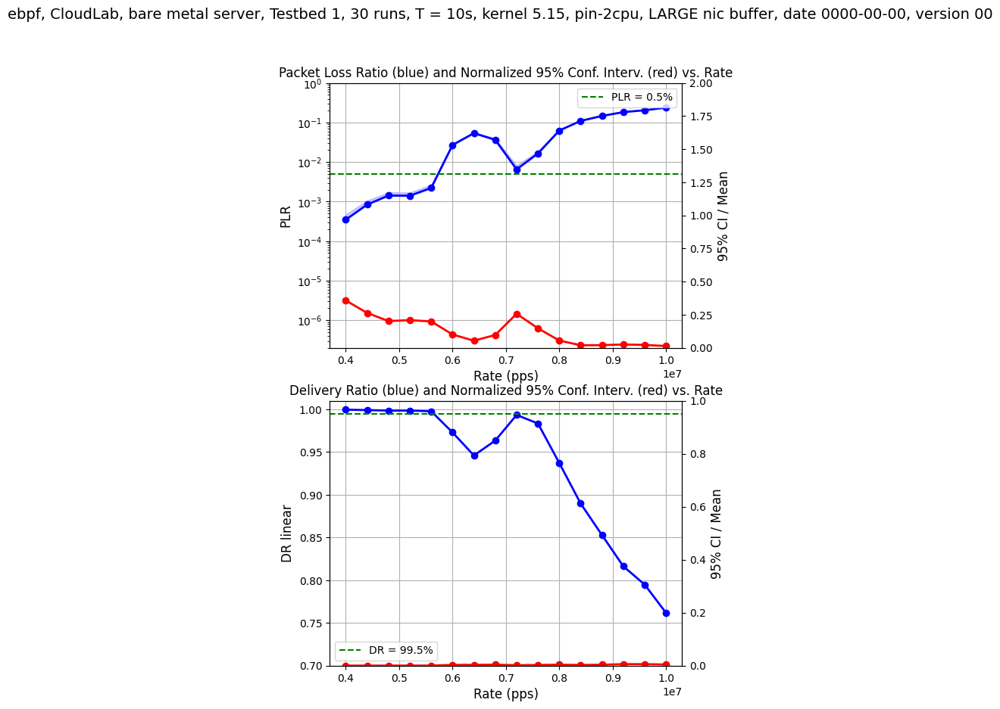

['ebpf, CloudLab, bare metal server, Testbed 1, 30 runs, T = 10s, kernel 6.5, unpinned, SMALL nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/ebpf_30/clab_tb1_raw_class_ebpf_30_exp_t_10_k6.5_intel_bare-metal_as-is.txt', [4000000, 4400000, 4800000, 5200000, 5600000, 6000000, 6400000, 6800000, 7200000, 7600000, 8000000, 8400000, 8800000, 9200000, 9600000, 10000000], [1.063347334624378, 0.8806928939845298, 0.6438899744218964, 0.6030888669046299, 1.1903347402879045, 0.1556534525756959, 0.14151550775744737, 0.737200238193389, 0.6192026101090474, 0.1074062415878668, 0.12701517181975694, 0.08980054858107615, 0.024144328134307058, 0.040485699273329456, 0.025281479553710056, 0.02719235951802202], [0.0004555891474717096, 0.0007462060879822041, 0.0008975972575718656, 0.0011412778521739015, 0.0034947773748769933, 0.029362108820402688, 0.03828549066645957, 0.004341151609877033, 0.018165981296489164, 0.06439457421008295, 0.10415385012041109, 0.1366835678732026, 0.1946621059055172, 0.234

<Figure size 800x2000 with 0 Axes>

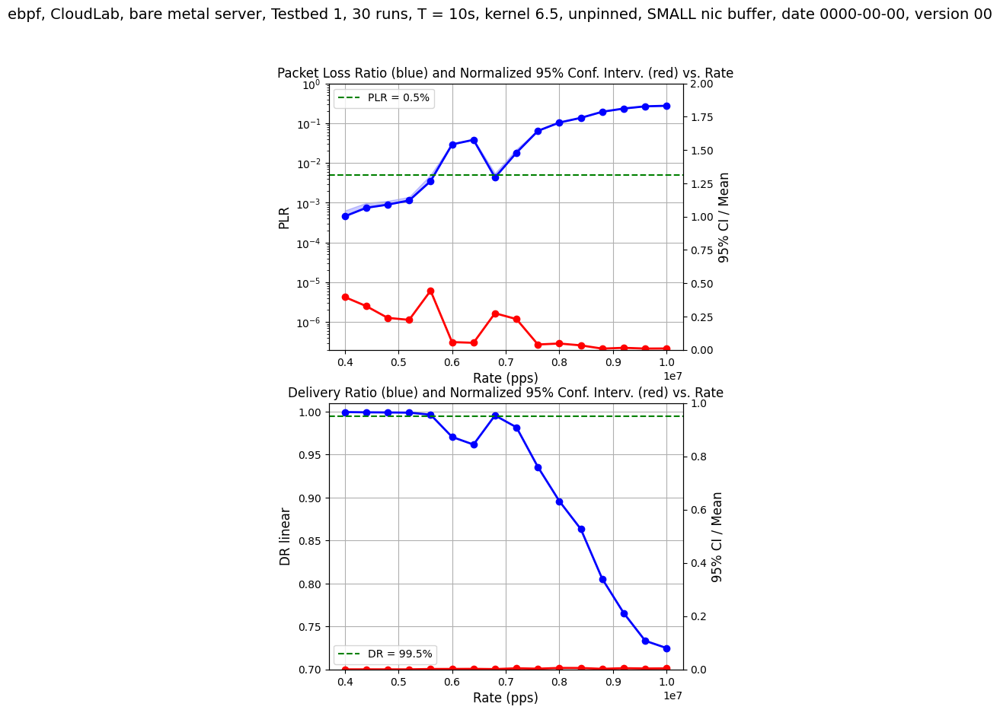

['ebpf, CloudLab, bare metal server, Testbed 1, 30 runs, T = 10s, kernel 6.5, unpinned, LARGE nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/ebpf_30/clab_tb1_raw_class_ebpf_30_exp_t_10_k6.5_intel_bare-metal_nic_buf_4096.txt', [4000000, 4400000, 4800000, 5200000, 5600000, 6000000, 6400000, 6800000, 7200000, 7600000, 8000000, 8400000, 8800000, 9200000, 9600000, 10000000], [3.488849727756071, 0.8482816971056121, 0.5732305291101903, 0.649043154672099, 0.15501085184446833, 0.302129359196405, 0.2815155688033912, 0.05673806098972016, 0.6810081028378312, 0.2763966451102916, 0.06995382295185834, 0.03598899517234843, 0.026399352072527704, 0.028082432184870002, 0.01580233040840302, 0.01635398208746447], [0.07281205653741647, 0.00046426797945506857, 0.0009067173715562093, 0.0009331345251273845, 0.0010826973301369318, 0.016130040292091048, 0.03990847593990537, 0.04728085747043931, 0.0037690354728283897, 0.026136479683222847, 0.07360256709415405, 0.11388339118643627, 0.1592832329441328

<Figure size 800x2000 with 0 Axes>

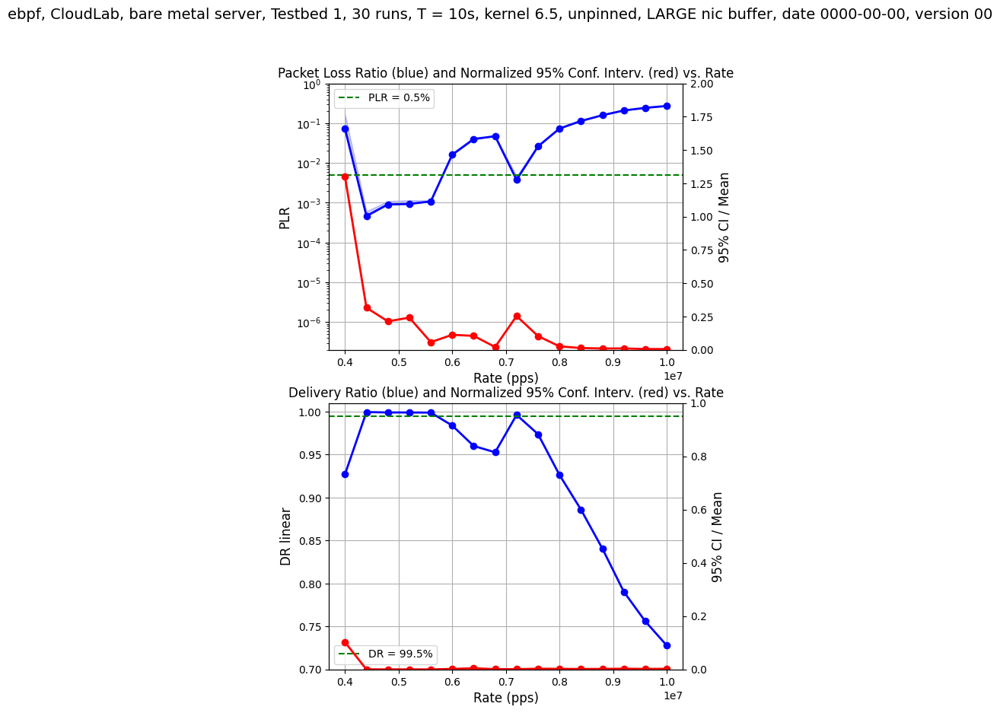

['ebpf, CloudLab, bare metal server, Testbed 1, 30 runs, T = 10s, kernel 6.5, pin-1cpu, LARGE nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/ebpf_30/clab_tb1_raw_class_ebpf_30_exp_t_10_k6.5_intel_bare-metal_nic_buf_4096_irq_pf0-4_pf1-4.txt', [4000000, 4400000, 4800000, 5200000, 5600000, 6000000, 6400000, 6800000, 7200000, 7600000, 8000000, 8400000, 8800000, 9200000, 9600000, 10000000], [0.6504046821283367, 0.6705518405037023, 0.6289923817961461, 0.6156350923698648, 0.5222930360885026, 0.10895526846517023, 0.6108362061877597, 0.8756704888678339, 0.6698683011714442, 0.13504155074134283, 0.09290564210382626, 0.04169793445972156, 0.030229279695100354, 0.023704602178056585, 0.024190043957473244, 0.019071607048248604], [0.0010315627070832333, 0.0011323684089770988, 0.0012887309902320269, 0.0016381413072576085, 0.006980944759621244, 0.03954093146162129, 0.009920604002958784, 0.0068513169114395945, 0.014811971015140143, 0.0355661216362916, 0.08423858844687299, 0.1255750558671684,

<Figure size 800x2000 with 0 Axes>

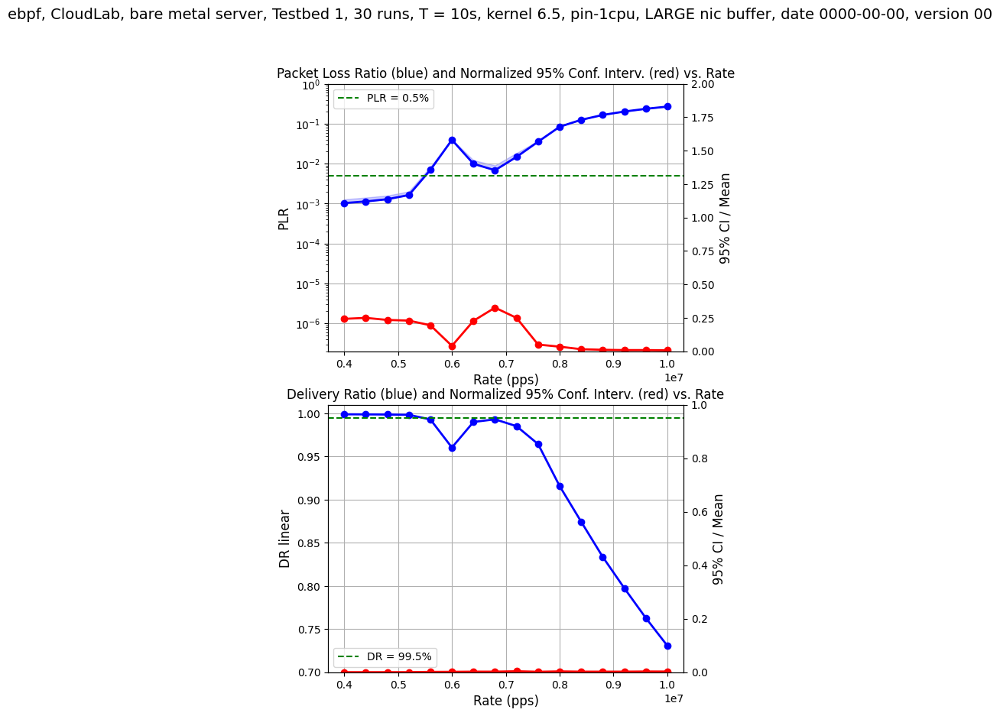

['ebpf, CloudLab, bare metal server, Testbed 1, 30 runs, T = 10s, kernel 6.5, pin-2cpu, LARGE nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/ebpf_30/clab_tb1_raw_class_ebpf_30_exp_t_10_k6.5_intel_bare-metal_nic_buf_4096_irq_pf0-4_pf1-6.txt', [4000000, 4400000, 4800000, 5200000, 5600000, 6000000, 6400000, 6800000, 7200000, 7600000, 8000000, 8400000, 8800000, 9200000, 9600000, 10000000], [1.2840431535387098, 0.6139425482226513, 0.580063945664842, 0.4541050810875087, 0.40691304506013704, 0.09206021862582997, 0.0858603143810672, 0.6434349672612103, 0.9322487523002132, 0.29884442895354785, 0.10921787397152449, 0.084177230357489, 0.05546757995079263, 0.0895778360719198, 0.04067361161876969, 0.025866009550381236], [0.001010772407021095, 0.001079647960741022, 0.0014264166580527575, 0.0019308738321458666, 0.001662651955179406, 0.02676783391214587, 0.05669875780069525, 0.026618179061856324, 0.009035042793641956, 0.02496095912117578, 0.071145114294485, 0.11744984944415995, 0.1657685

<Figure size 800x2000 with 0 Axes>

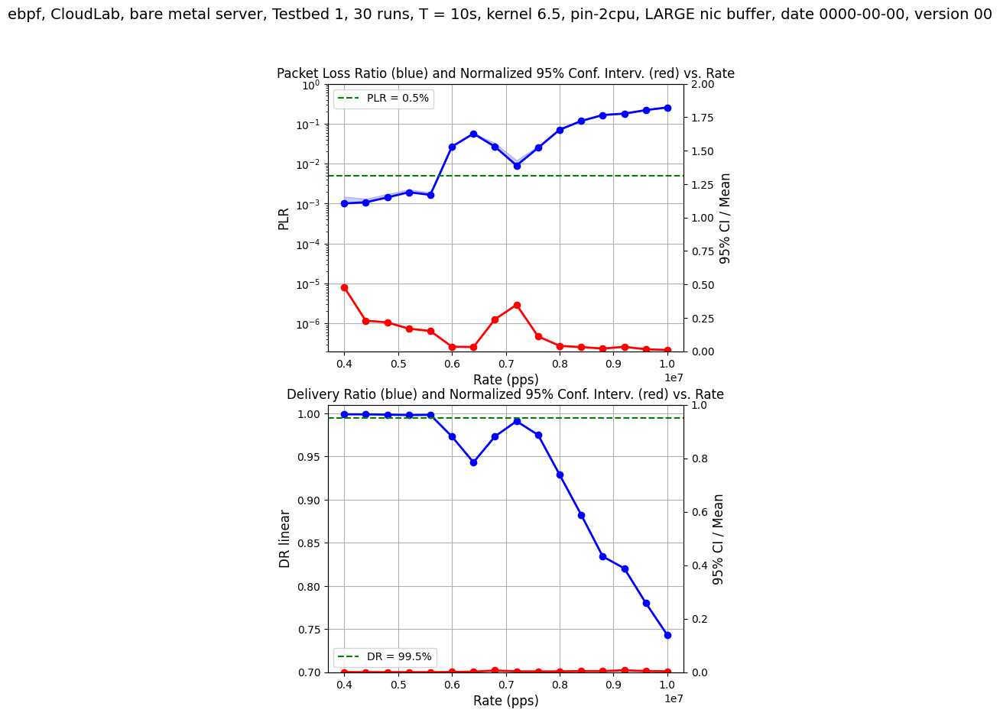

In [ ]:
# GENERATES THE GRAPHS
# prompt: create a bar chart with x-axis rate_list and y-axis drop_pkt_mean_list

import matplotlib.pyplot as plt
import math

ADD_SUBTITLE = True

def t_distribution(k):
  """ evaluates the t distribution for k degrees of freedom

      the values have been taken from https://en.wikipedia.org/wiki/Student's_t-distribution
  """

  if k == 50: return 2.009
  if k == 40: return 2.021
  if k == 30: return 2.042
  if k == 25: return 2.060
  if k == 20: return 2.086
  raise ValueError("k must be 20, 25, 30, 40 or 50")


def t_distribution_array(np_array):
  return_list=[]
  for i in range(len(np_array)):
    return_list.append(t_distribution(np_array[i]))
  return np.array(return_list)

print(exp_data_filtered)

for exp in exp_data_filtered:
  print(exp)
  suptitle = exp[0]
  name_exp=exp[1]
  rate_list=exp[2]
  cv_drop_pkt_list=exp[3]  #THIS WILL NOT BE USED

  drop_ratio_mean_list=exp[4]
  drop_ratio_std_list=exp[5]
  cv_drop_ratio_list=exp[6]

  delivery_ratio_mean_list=exp[7]
  delivery_ratio_std_list=exp[8]
  cv_delivery_ratio_list=exp[9]
  num_of_experiments_list=exp[10]

  #print(name_exp)
  #print(rate_list)
  #print(cv_delivery_ratio_list)
  #print(drop_ratio_std_list)

  np_drop_ratio_mean=np.array(drop_ratio_mean_list)
  np_drop_ratio_std=np.array(drop_ratio_std_list)
  np_drop_ratio_cv=np.array(cv_drop_ratio_list)
  np_num_of_experiments=np.array(num_of_experiments_list)

  #np_drop_ratio_normalized_conf_interval=np_drop_ratio_cv*(1/math.sqrt(NUM_OF_EXPERIMENTS))*t_distribution(NUM_OF_EXPERIMENTS)
  #np_drop_ratio_normalized_conf_interval=np_drop_ratio_cv/np.sqrt(np_num_of_experiments)

  np_drop_ratio_normalized_conf_interval=np_drop_ratio_cv/np.sqrt(np_num_of_experiments)*t_distribution_array(np_num_of_experiments)

  #np_bottom=np_mean-np_std*1.96
  #np_top=np.maximum(np_mean+np_std*1.96, 10e-6)
  np_drop_ratio_top=np_drop_ratio_mean+np_drop_ratio_std/np.sqrt(np_num_of_experiments)*t_distribution_array(np_num_of_experiments)

  CV_DROP_CAP = 2
  #tweak the cv_drop to cap at CV_DROP_CAP
  np_drop_ratio_normalized_conf_interval = [min(x, CV_DROP_CAP) for x in np_drop_ratio_normalized_conf_interval] # cap at CV_DROP_CAP

  np_delivery_ratio_mean=np.array(delivery_ratio_mean_list)
  np_delivery_ratio_std=np.array(delivery_ratio_std_list)
  np_delivery_ratio_cv=np.array(cv_delivery_ratio_list)

  #np_cv_dr=np.array(cv_delivery_ratio_list)
  #np_cv_top=np_cv_dr*(1/math.sqrt(NUM_OF_EXPERIMENTS))*1.96
  np_delivery_ratio_normalized_conf_interval=np_delivery_ratio_cv/np.sqrt(np_num_of_experiments)*t_distribution_array(np_num_of_experiments)
  #print(np_bottom)
  #print(np_top)

  CV_DROP_CAP = 2
  #tweak the cv_drop to cap at CV_DROP_CAP
  np_delivery_ratio_normalized_conf_interval = [min(x, CV_DROP_CAP) for x in np_delivery_ratio_normalized_conf_interval] # cap at CV_DROP_CAP



  # Create the plot
  plt.figure(figsize=(8, 20))

  fig, (ax1, bx1) = plt.subplots(2, 1, figsize=(6, 10))
  ax2 = ax1.twinx()

  ax1.semilogy(rate_list, drop_ratio_mean_list, marker='o', color='b',
  linestyle='-', linewidth=2, markersize=6)
  ax1.fill_between(rate_list, np_drop_ratio_mean, np_drop_ratio_top, color='b', alpha=0.2)

  ax2.plot(rate_list, np_drop_ratio_normalized_conf_interval, marker='o', color='r',
  linestyle='-', linewidth=2, markersize=6)

  #plt.errorbar(rate_list, drop_ratio_mean_list, yerr=drop_ratio_std_list, marker='o', color='b',
  #linestyle='-', linewidth=2, markersize=6)

  # Add horizontal line at y=0.5*10e-2
  ax1.axhline(y=0.5 * 1e-2, color='green', linestyle='--', linewidth=1.5, label='PLR = 0.5%')

  # Add titles and labels
  # plt.title("Packet Loss Ratio (blue) and Normalized 95% Conf. Interv. (red) vs. Rate", fontsize=12)
  if ADD_SUBTITLE:
    plt.suptitle(suptitle, fontsize=14)

  ax1.title.set_text("Packet Loss Ratio (blue) and Normalized 95% Conf. Interv. (red) vs. Rate")
  ax1.set_xlabel("Rate (pps)", fontsize=12)
  ax1.set_ylabel("PLR", fontsize=12)
  ax2.set_ylabel("95% CI / Mean", fontsize=12)
  ax1.set_ylim(20e-8, 10e-1)  #range from 2*10e-8 to 10e-1
  ax2.set_ylim(0, CV_DROP_CAP)       #range from 0 to 1.0
  ax1.grid(True)
  #ax2.grid(True)

  # Add legend for the horizontal line
  ax1.legend(loc='best')

  #######################
  #Plot Delivery Ratio Linear
  bx2 = bx1.twinx()
  bx1.plot(rate_list, delivery_ratio_mean_list, marker='o', color='b',
  linestyle='-', linewidth=2, markersize=6)
  #bx1.fill_between(rate_list, np_mean, np_top, color='b', alpha=0.2)

  bx2.plot(rate_list, np_delivery_ratio_normalized_conf_interval, marker='o', color='r',
  linestyle='-', linewidth=2, markersize=6)

  # Add horizontal line at y=99.5*10e-2
  bx1.axhline(y=99.5 * 1e-2, color='green', linestyle='--', linewidth=1.5, label='DR = 99.5%')

  bx1.title.set_text("Delivery Ratio (blue) and Normalized 95% Conf. Interv. (red) vs. Rate")
  bx1.set_xlabel("Rate (pps)", fontsize=12)
  bx1.set_ylabel("DR linear", fontsize=12)
  bx2.set_ylabel("95% CI / Mean", fontsize=12)
  bx1.set_ylim(0.7, 1.01)  #range from 2*10e-8 to 10e-1
  bx2.set_ylim(0, 1.0)       #range from 0 to 1.0
  bx1.grid(True)
  #ax2.grid(True)

  # Add legend for the horizontal line
  bx1.legend(loc='best')




  # Show the plot
  plt.show()

In [ ]:
# ANALIZE THE DATA FOR SATURATION CHECK

def detect_saturation(list_of_PLR, list_of_O, PDR_fraction, saturation_detection_threshold, initial_saturation_multiplier,
                      step_PDR_value, step_saturation_value):
    """
    Detects the saturation point based on the provided PLR values, offered load, and PDR threshold.

    Parameters:
    - list_of_PLR: List of Packet Loss Ratios (PLR) at different offered load values.
    - list_of_O: List of offered load values corresponding to the PLR values (e.g., in Mpps).
    - PDR_fraction: Threshold for PDR, e.g., 0.005 for PDR@0.5%.
    - saturation_detection_threshold: Threshold for saturation detection.
    - initial_saturation_multiplier: Initial multiplier for saturation detection.
    - step_PDR_value: Step value for visualization of PDR offered load
    - step_saturation_value: Step value visualization of saturation detection offered load

    Returns:
    - potential_saturation_index: The index after the first where PLR exceeds the PDR threshold.
    - actual_saturation_index: The actual index of the saturation point.
    - list_of_bool_past_PDR: List of booleans indicating if PLR > PDR_fraction at each index.
    - list_of_TIR: List of Throughput Increase Ratios (TIR), with values of 0 for indices < potential_saturation_index.
    - list_of_saturation_TIR_bool: List of booleans indicating if TIR < saturation_detection_threshold at each index.
    - step_function_PDR
    - step_function_saturation
    - good_or_bad : True if the experiment is good, False otherwise
    """
    # Determine list_of_bool_past_PDR: True if PLR > PDR_fraction, False otherwise
    list_of_bool_past_PDR = [plr > PDR_fraction for plr in list_of_PLR]

    # Find the first index where list_of_bool_past_PDR is True (past_PDR_index)
    try:
        past_PDR_index = list_of_bool_past_PDR.index(True)
    except ValueError:
        # If no value is above the threshold, return None for potential_saturation_index
        past_PDR_index = None
        potential_saturation_index = None

    # Calculate the list_of_TIR and find the actual index of the saturation point
    actual_saturation_index = None
    #print (f"past_PDR_index: {past_PDR_index}")
    list_of_TIR = [0] * len(list_of_O)  # Initialize with zeros
    list_of_saturation_TIR_bool = [False] * len(list_of_O)  # Initialize with False
    step_function_PDR = [0] * len(list_of_O) # Initialize with zeros
    step_function_saturation = [0] * len(list_of_O) # Initialize with zeros

    if past_PDR_index is not None and past_PDR_index + 1 < len(list_of_O):
        potential_saturation_index = past_PDR_index + 1
        for i in range(past_PDR_index, len(list_of_O) - 1):
            step_function_PDR[i] = step_PDR_value
            step_function_PDR[i+1] = step_PDR_value #not very efficient to set each element twice but it works...

            # Calculate TIR for each step after past_PDR_index
            delta_Tsat = list_of_O[i + 1] * (1 - list_of_PLR[i + 1]) - list_of_O[i] * (1 - list_of_PLR[i])
            delta_O = list_of_O[i + 1] - list_of_O[i]
            list_of_TIR[i + 1] = delta_Tsat / delta_O if delta_O != 0 else 0
    else:
        potential_saturation_index = None

    if potential_saturation_index :
      saturation_state= False
      for i in range(potential_saturation_index, len(list_of_O)):
        if list_of_TIR[i] < saturation_detection_threshold if saturation_state else saturation_detection_threshold * initial_saturation_multiplier:
          if saturation_state == False:
            actual_saturation_index = i
          saturation_state = True
          list_of_saturation_TIR_bool[i] = True
          step_function_saturation[i] = step_saturation_value
        else:
          if saturation_state:
            saturation_state = False
            #clear the previously set list_of_saturation_TIR_bool
            list_of_saturation_TIR_bool = [False] * len(list_of_O)
            #clear the previously set step_function_saturation
            step_function_saturation = [0] * len(list_of_O)
            actual_saturation_index = None
    good_or_bad = actual_saturation_index is not None and potential_saturation_index is not None and actual_saturation_index == potential_saturation_index

    return (potential_saturation_index, actual_saturation_index,
            list_of_bool_past_PDR, list_of_TIR, list_of_saturation_TIR_bool,
            step_function_PDR, step_function_saturation, good_or_bad)

for exp in exp_data_filtered:
    # Extract experiment details
    #print(exp)
    suptitle = exp[0]
    name_exp = exp[1]
    rate_list = exp[2]
    drop_ratio_mean_list = exp[4]  # List of PLR(O) values (mean drop ratio)
    PDR_fraction = 0.005  # For PDR@0.5%
    saturation_detection_threshold = 0.1
    initial_saturation_multiplier = 3
    my_step_PDR_value= 1
    my_step_saturation_value=1

    # Use detect_saturation function
    (potential_saturation_index, actual_saturation_index,
     list_of_bool_past_PDR, list_of_TIR, list_of_saturation_TIR_bool,
     step_function_PDR, step_function_saturation, good_or_bad) = detect_saturation(
        drop_ratio_mean_list, rate_list, PDR_fraction,
        saturation_detection_threshold, initial_saturation_multiplier, my_step_PDR_value, my_step_saturation_value
    )

    # Print the results for this experiment
    print(f"Experiment: {name_exp}")
    print(f"Potential Saturation Index: {potential_saturation_index}")
    print(f"Actual Saturation Index: {actual_saturation_index}")
    #print(f"List of Booleans past PDR threshold: {list_of_bool_past_PDR}")
    print(f"List of TIR values: {list_of_TIR}")
    #print(f"List of Booleans for TIR < {saturation_detection_threshold}: {list_of_saturation_TIR_bool}")
    print(f"Step function for PDR: {step_function_PDR}")
    print(f"Step function for saturation: {step_function_saturation}")

    if good_or_bad:
      print("GOOD EXPERIMENT")
    else:
      print("BAD EXPERIMENT")

    print("\n")

    exp.append(step_function_PDR)
    exp.append(step_function_saturation)
    exp.append(good_or_bad)
    print(exp)

Experiment: misure/bare-metal/ebpf_30/clab_tb1_class_ebpf_raw_30_exp_t_10_k5.15_intel_bare-metal_as-is.txt
Potential Saturation Index: 9
Actual Saturation Index: 15
List of TIR values: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0.45761001531036805, 0.6475711916725594, 1.503199227053742, 1.0796861553556496, 1.3424146823718073, 0.9155904132686415, 0.009796789264725521]
Step function for PDR: [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Step function for saturation: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]
BAD EXPERIMENT


['ebpf, CloudLab, bare metal server, Testbed 1, 30 runs, T = 10s, kernel 5.15, unpinned, SMALL nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/ebpf_30/clab_tb1_class_ebpf_raw_30_exp_t_10_k5.15_intel_bare-metal_as-is.txt', [4000000, 4400000, 4800000, 5200000, 5600000, 6000000, 6400000, 6800000, 7200000, 7600000, 8000000, 8400000, 8800000, 9200000, 9600000, 10000000], [0.7610358577788202, 0.4651897508684348, 0.6168884365560753, 0.43498025505033727, 0.73326417348

['ebpf, CloudLab, bare metal server, Testbed 1, 30 runs, T = 10s, kernel 5.15, unpinned, SMALL nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/ebpf_30/clab_tb1_class_ebpf_raw_30_exp_t_10_k5.15_intel_bare-metal_as-is.txt', [4000000, 4400000, 4800000, 5200000, 5600000, 6000000, 6400000, 6800000, 7200000, 7600000, 8000000, 8400000, 8800000, 9200000, 9600000, 10000000], [0.7610358577788202, 0.4651897508684348, 0.6168884365560753, 0.43498025505033727, 0.7332641734824877, 0.795162615355242, 0.8698462545765484, 0.9698644506633611, 0.13268153320581957, 0.052066289965500764, 0.05843406369467348, 0.16737792536287827, 0.21007580808941131, 0.9717511211334702, 0.4337087398933696, 0.12471491288740764], [0.00043788500000000824, 0.0014419726617285152, 0.0012937812769537797, 0.0014417646881372556, 0.001200329123797772, 0.0013474215768385588, 0.0013939777784138907, 0.0011862326163575001, 0.010049820826413773, 0.038067724187635814, 0.05378577839462606, 0.02726268289708477, 0.0224013720674150

<Figure size 800x2000 with 0 Axes>

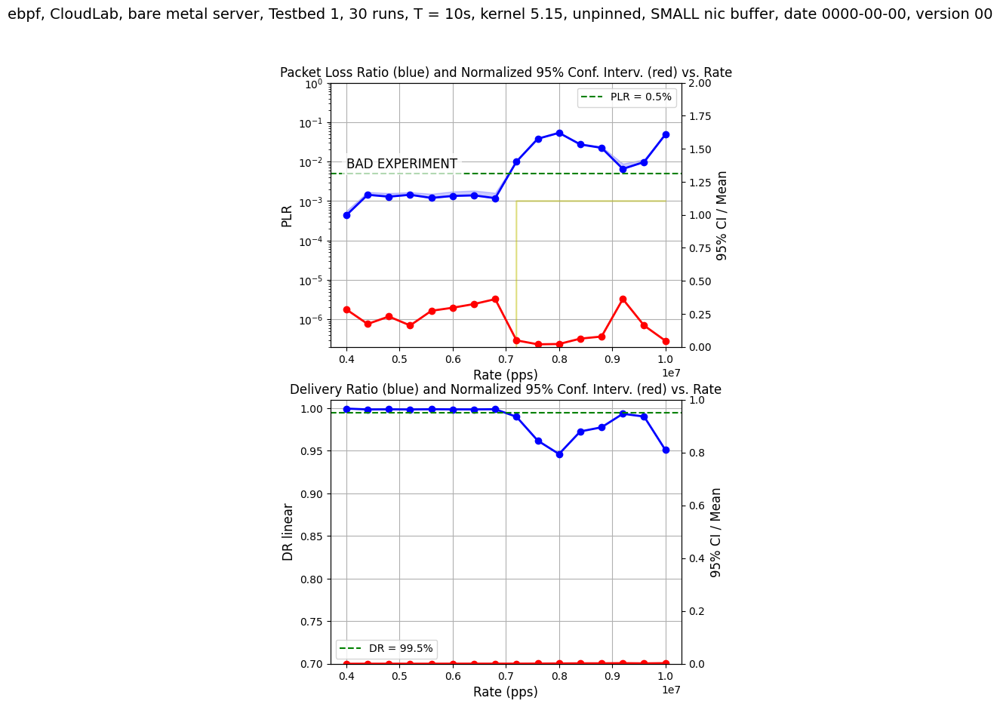

['ebpf, CloudLab, bare metal server, Testbed 1, 30 runs, T = 10s, kernel 5.15, unpinned, LARGE nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/ebpf_30/clab_tb1_class_ebpf_raw_30_exp_t_10_k5.15_intel_bare-metal_nic_buf_4096.txt', [4000000, 4400000, 4800000, 5200000, 5600000, 6000000, 6400000, 6800000, 7200000, 7600000, 8000000, 8400000, 8800000, 9200000, 9600000, 10000000], [3.3427238543487587, 0.7450456279543546, 0.5441017587720226, 0.8416493055349477, 0.6287715136174612, 0.5850353387647037, 0.5900411477164674, 0.06660762482867934, 0.05528509959182946, 0.35696704859303596, 0.6663862527257308, 0.8299898172705332, 0.18904016222333758, 0.06435449909202863, 0.047490099322738184, 0.022985529859527294], [0.07657500468499906, 0.0008944158684356495, 0.0015036099781137477, 0.0009431789549821897, 0.0016004683715791187, 0.0023722285685206326, 0.0025307440539039106, 0.029815011456934094, 0.047568657985848944, 0.01176928284277592, 0.007861950231693792, 0.005621689175483691, 0.023986831

<Figure size 800x2000 with 0 Axes>

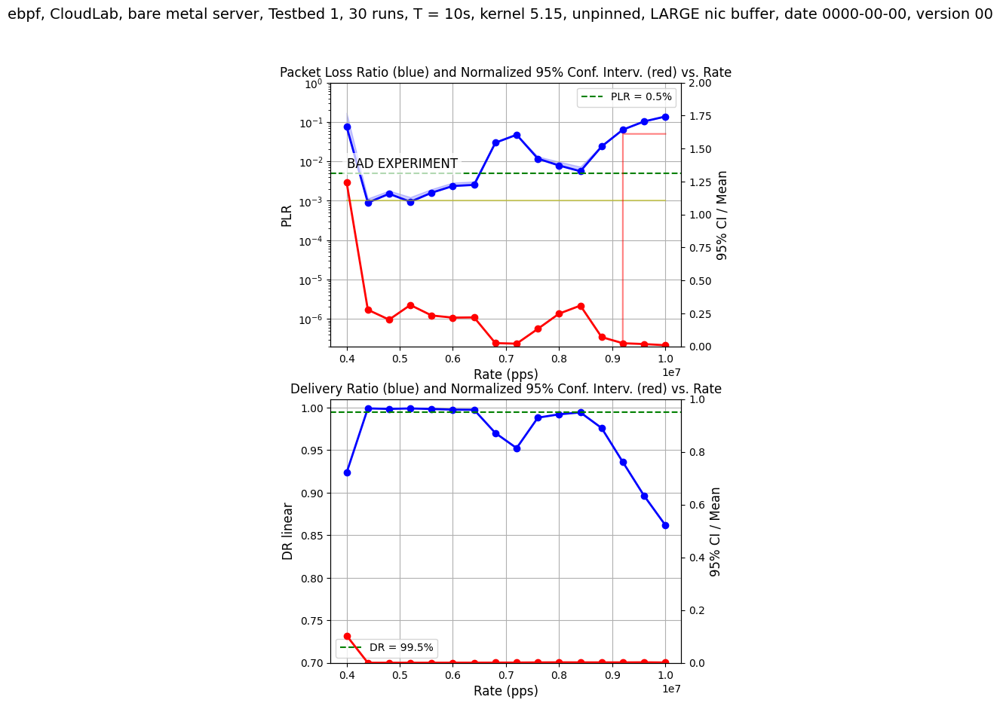

['ebpf, CloudLab, bare metal server, Testbed 1, 30 runs, T = 10s, kernel 5.15, pin-1cpu, LARGE nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/ebpf_30/clab_tb1_class_ebpf_raw_30_exp_t_10_k5.15_intel_bare-metal_nic_buf_4096_irq_pf0-4_pf1-4.txt', [4000000, 4400000, 4800000, 5200000, 5600000, 6000000, 6400000, 6800000, 7200000, 7600000, 8000000, 8400000, 8800000, 9200000, 9600000, 10000000], [0.43347239017884986, 0.6997863224201462, 0.7360048415968798, 0.49495634994918924, 0.5893068693007438, 0.5402794954315284, 0.7022839042053229, 0.07386481536637936, 0.057271837822502066, 0.33058240004007905, 0.7622088714062762, 0.7156253184733481, 0.1727219549819508, 0.0714896505869696, 0.049727875903905594, 0.040493453783647035], [0.0011922303874748721, 0.0012127483887718522, 0.0010794955184804703, 0.0017219001986807814, 0.0020748173335722467, 0.0022666385333239576, 0.005213139563677912, 0.035414548131532456, 0.047068493004312484, 0.012574559972183859, 0.005519669817235247, 0.008153301527

<Figure size 800x2000 with 0 Axes>

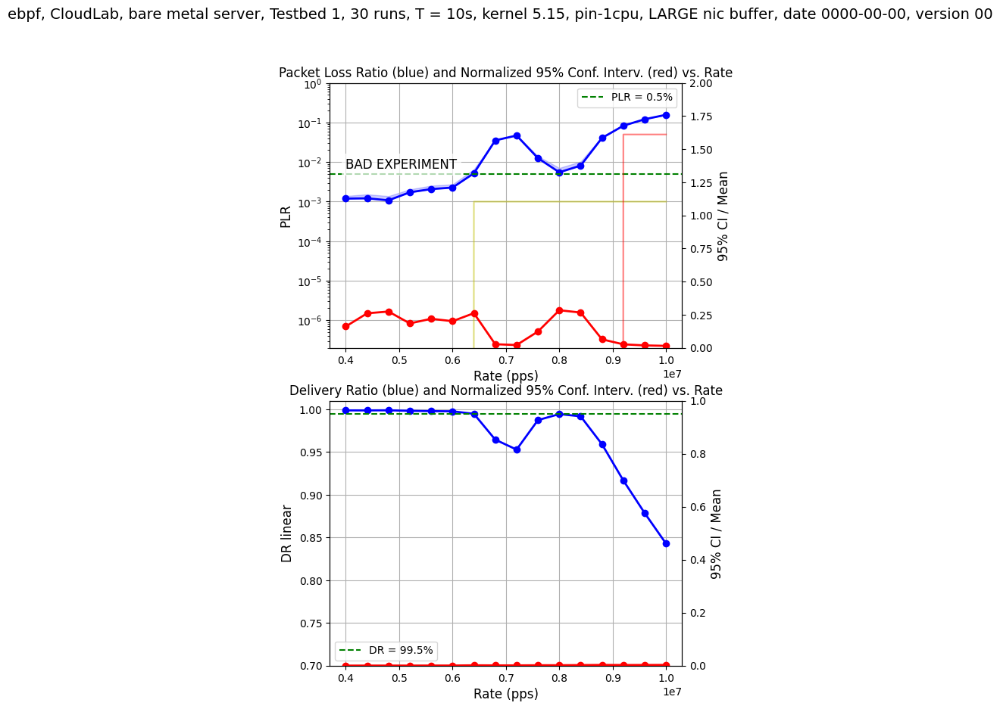

['ebpf, CloudLab, bare metal server, Testbed 1, 30 runs, T = 10s, kernel 5.15, pin-2cpu, LARGE nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/ebpf_30/clab_tb1_class_ebpf_raw_30_exp_t_10_k5.15_intel_bare-metal_nic_buf_4096_irq_pf0-4_pf1-6.txt', [4000000, 4400000, 4800000, 5200000, 5600000, 6000000, 6400000, 6800000, 7200000, 7600000, 8000000, 8400000, 8800000, 9200000, 9600000, 10000000], [0.9593333426120744, 0.7072432361721676, 0.5427256874380828, 0.5613295643872503, 0.5351028140808164, 0.2705787283539464, 0.1446163678321439, 0.2612663985255352, 0.6906970641531263, 0.39615503345160435, 0.14794119799841138, 0.05281520930974968, 0.05501400055428331, 0.06833689845276147, 0.059510702176668984, 0.03706183480969727], [0.00034959057988017685, 0.0008407231858490091, 0.0014221888629309916, 0.0014115008038911192, 0.002210912393675953, 0.027002049000683, 0.05395281704877874, 0.036527584438012774, 0.0065504037903497125, 0.01653278597548181, 0.0628271273190051, 0.11017480815350747, 0.

<Figure size 800x2000 with 0 Axes>

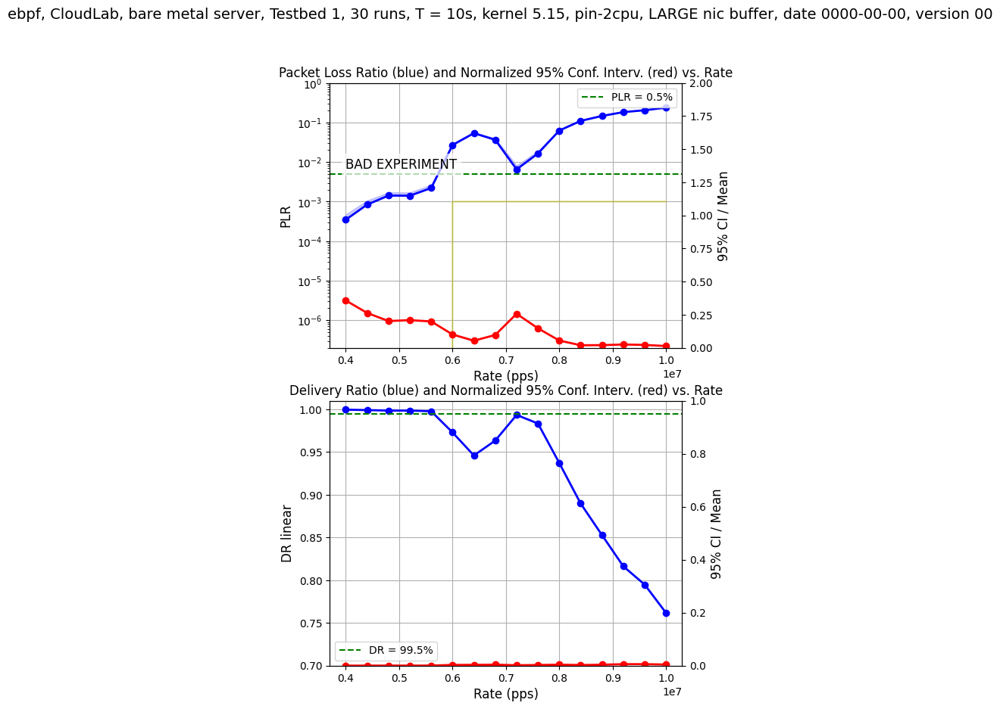

['ebpf, CloudLab, bare metal server, Testbed 1, 30 runs, T = 10s, kernel 6.5, unpinned, SMALL nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/ebpf_30/clab_tb1_class_ebpf_raw_30_exp_t_10_k6.5_intel_bare-metal_as-is.txt', [4000000, 4400000, 4800000, 5200000, 5600000, 6000000, 6400000, 6800000, 7200000, 7600000, 8000000, 8400000, 8800000, 9200000, 9600000, 10000000], [1.063347334624378, 0.8806928939845298, 0.6438899744218964, 0.6030888669046299, 1.1903347402879045, 0.1556534525756959, 0.14151550775744737, 0.737200238193389, 0.6192026101090474, 0.1074062415878668, 0.12701517181975694, 0.08980054858107615, 0.024144328134307058, 0.040485699273329456, 0.025281479553710056, 0.02719235951802202], [0.0004555891474717096, 0.0007462060879822041, 0.0008975972575718656, 0.0011412778521739015, 0.0034947773748769933, 0.029362108820402688, 0.03828549066645957, 0.004341151609877033, 0.018165981296489164, 0.06439457421008295, 0.10415385012041109, 0.1366835678732026, 0.1946621059055172, 0.234

<Figure size 800x2000 with 0 Axes>

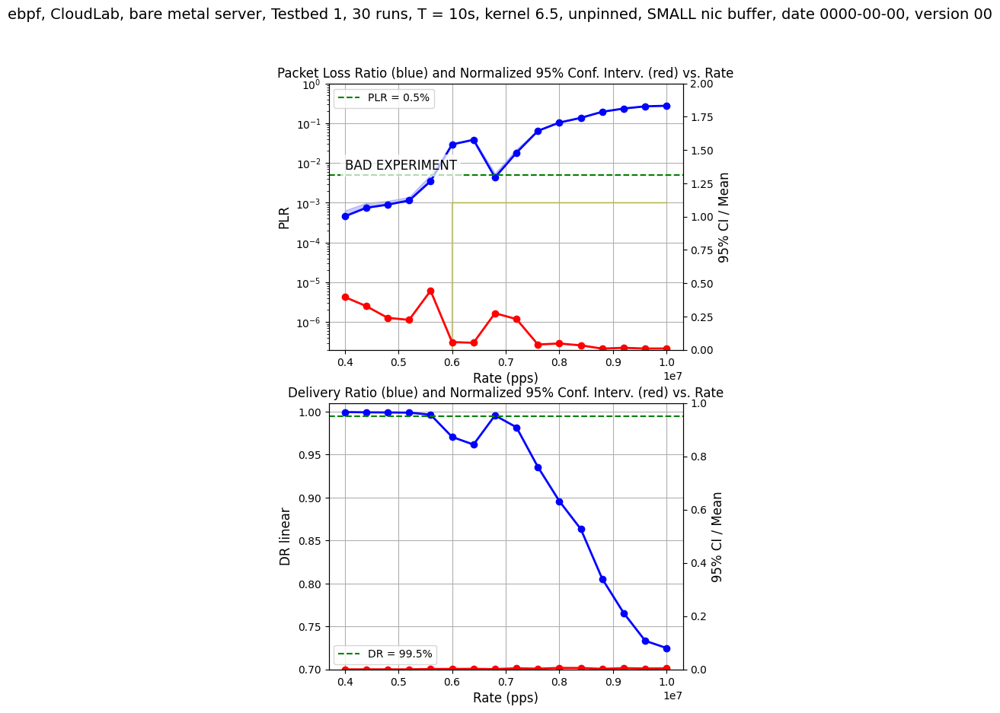

['ebpf, CloudLab, bare metal server, Testbed 1, 30 runs, T = 10s, kernel 6.5, unpinned, LARGE nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/ebpf_30/clab_tb1_class_ebpf_raw_30_exp_t_10_k6.5_intel_bare-metal_nic_buf_4096.txt', [4000000, 4400000, 4800000, 5200000, 5600000, 6000000, 6400000, 6800000, 7200000, 7600000, 8000000, 8400000, 8800000, 9200000, 9600000, 10000000], [3.488849727756071, 0.8482816971056121, 0.5732305291101903, 0.649043154672099, 0.15501085184446833, 0.302129359196405, 0.2815155688033912, 0.05673806098972016, 0.6810081028378312, 0.2763966451102916, 0.06995382295185834, 0.03598899517234843, 0.026399352072527704, 0.028082432184870002, 0.01580233040840302, 0.01635398208746447], [0.07281205653741647, 0.00046426797945506857, 0.0009067173715562093, 0.0009331345251273845, 0.0010826973301369318, 0.016130040292091048, 0.03990847593990537, 0.04728085747043931, 0.0037690354728283897, 0.026136479683222847, 0.07360256709415405, 0.11388339118643627, 0.1592832329441328

<Figure size 800x2000 with 0 Axes>

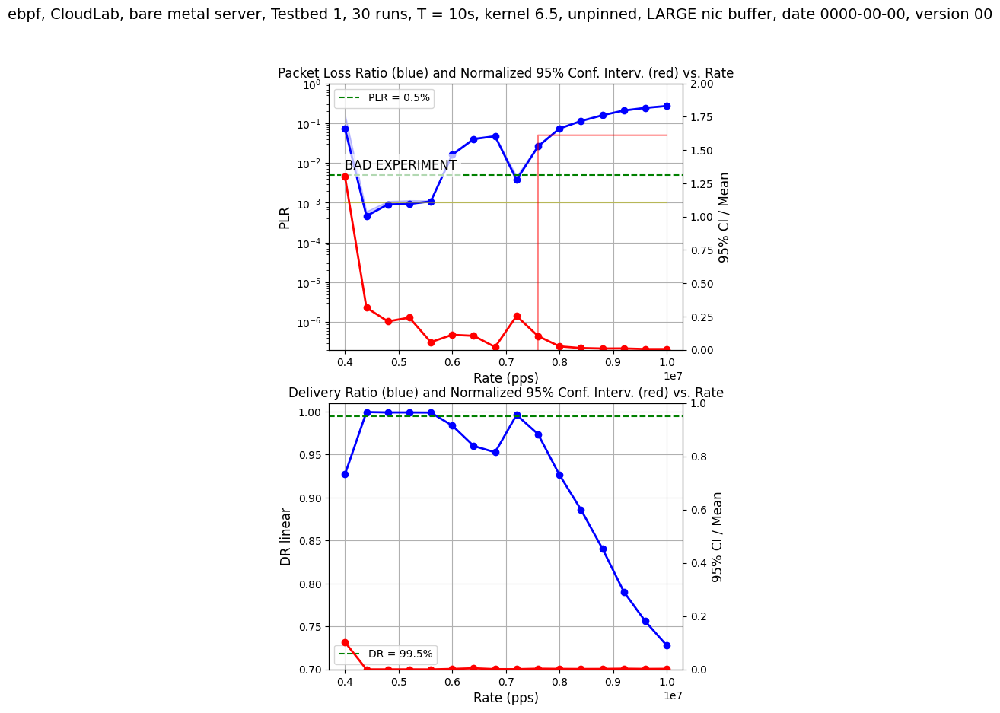

['ebpf, CloudLab, bare metal server, Testbed 1, 30 runs, T = 10s, kernel 6.5, pin-1cpu, LARGE nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/ebpf_30/clab_tb1_class_ebpf_raw_30_exp_t_10_k6.5_intel_bare-metal_nic_buf_4096_irq_pf0-4_pf1-4.txt', [4000000, 4400000, 4800000, 5200000, 5600000, 6000000, 6400000, 6800000, 7200000, 7600000, 8000000, 8400000, 8800000, 9200000, 9600000, 10000000], [0.6504046821283367, 0.6705518405037023, 0.6289923817961461, 0.6156350923698648, 0.5222930360885026, 0.10895526846517023, 0.6108362061877597, 0.8756704888678339, 0.6698683011714442, 0.13504155074134283, 0.09290564210382626, 0.04169793445972156, 0.030229279695100354, 0.023704602178056585, 0.024190043957473244, 0.019071607048248604], [0.0010315627070832333, 0.0011323684089770988, 0.0012887309902320269, 0.0016381413072576085, 0.006980944759621244, 0.03954093146162129, 0.009920604002958784, 0.0068513169114395945, 0.014811971015140143, 0.0355661216362916, 0.08423858844687299, 0.1255750558671684,

<Figure size 800x2000 with 0 Axes>

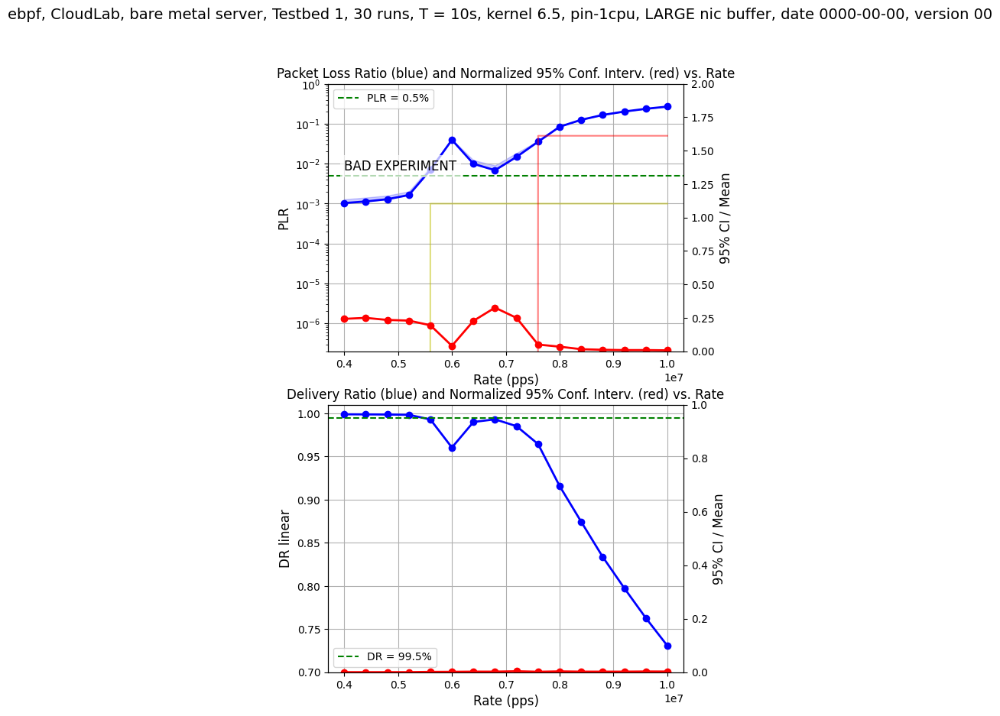

['ebpf, CloudLab, bare metal server, Testbed 1, 30 runs, T = 10s, kernel 6.5, pin-2cpu, LARGE nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/ebpf_30/clab_tb1_class_ebpf_raw_30_exp_t_10_k6.5_intel_bare-metal_nic_buf_4096_irq_pf0-4_pf1-6.txt', [4000000, 4400000, 4800000, 5200000, 5600000, 6000000, 6400000, 6800000, 7200000, 7600000, 8000000, 8400000, 8800000, 9200000, 9600000, 10000000], [1.2840431535387098, 0.6139425482226513, 0.580063945664842, 0.4541050810875087, 0.40691304506013704, 0.09206021862582997, 0.0858603143810672, 0.6434349672612103, 0.9322487523002132, 0.29884442895354785, 0.10921787397152449, 0.084177230357489, 0.05546757995079263, 0.0895778360719198, 0.04067361161876969, 0.025866009550381236], [0.001010772407021095, 0.001079647960741022, 0.0014264166580527575, 0.0019308738321458666, 0.001662651955179406, 0.02676783391214587, 0.05669875780069525, 0.026618179061856324, 0.009035042793641956, 0.02496095912117578, 0.071145114294485, 0.11744984944415995, 0.1657685

<Figure size 800x2000 with 0 Axes>

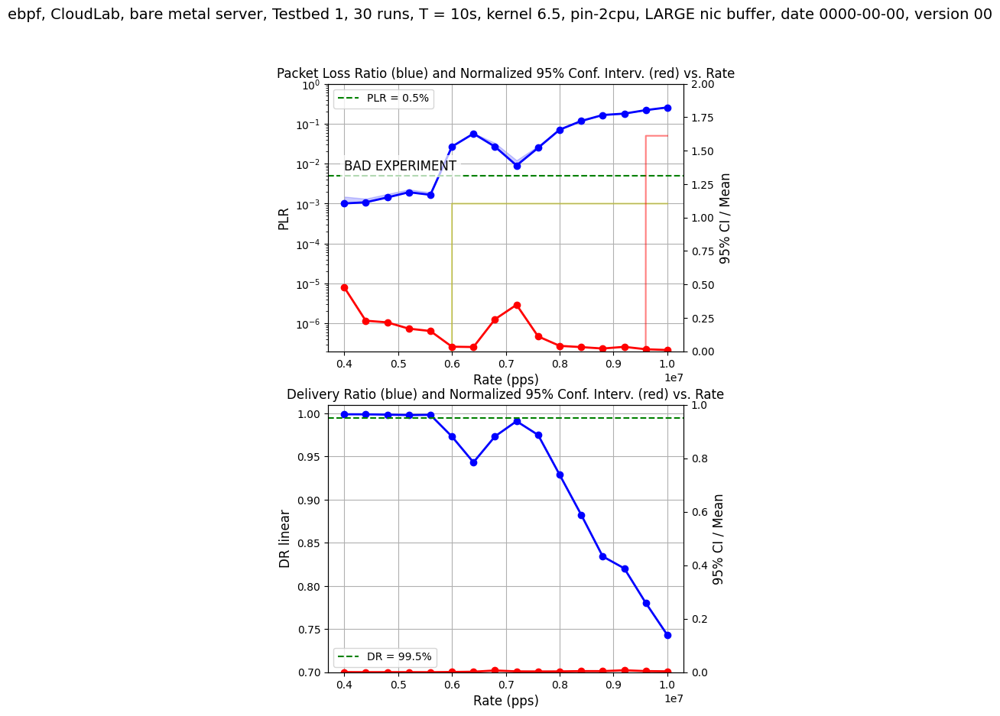

['routing, CloudLab, bare metal server, Testbed 0, 50 runs, T = 10s, kernel 5.15, unpinned, SMALL nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/clab_raw_50_k5.15_intel_bare-metal_as-is.txt', [300000, 450000, 600000, 750000, 900000, 1050000, 1200000, 1350000, 1500000], [0.6431153797098695, 0.6662022886326834, 0.5902014596761624, 0.8383100242622388, 0.862074859046178, 0.9346611167305423, 0.8080862739724647, 0.04573976389366902, 0.025713923383498656], [1e-06, 1e-06, 5.8583323569445514e-05, 0.004960106005319198, 0.018996782333690856, 0.01491443238095238, 0.028982126666666677, 0.08524867516676482, 0.17072302595179825], [2.229468135876138e-07, 1.6581031780817143e-07, 3.5264531338236105e-05, 0.004158889008247403, 0.016377318955241117, 0.01394056313199427, 0.0234205301335245, 0.00389927799128876, 0.004389970808953713], [0.2229468135876138, 0.16581031780817143, 0.6019551160567567, 0.8384677673798557, 0.862110154633708, 0.9347028955522393, 0.8081025386056725, 0.045740042102248864,

<Figure size 800x2000 with 0 Axes>

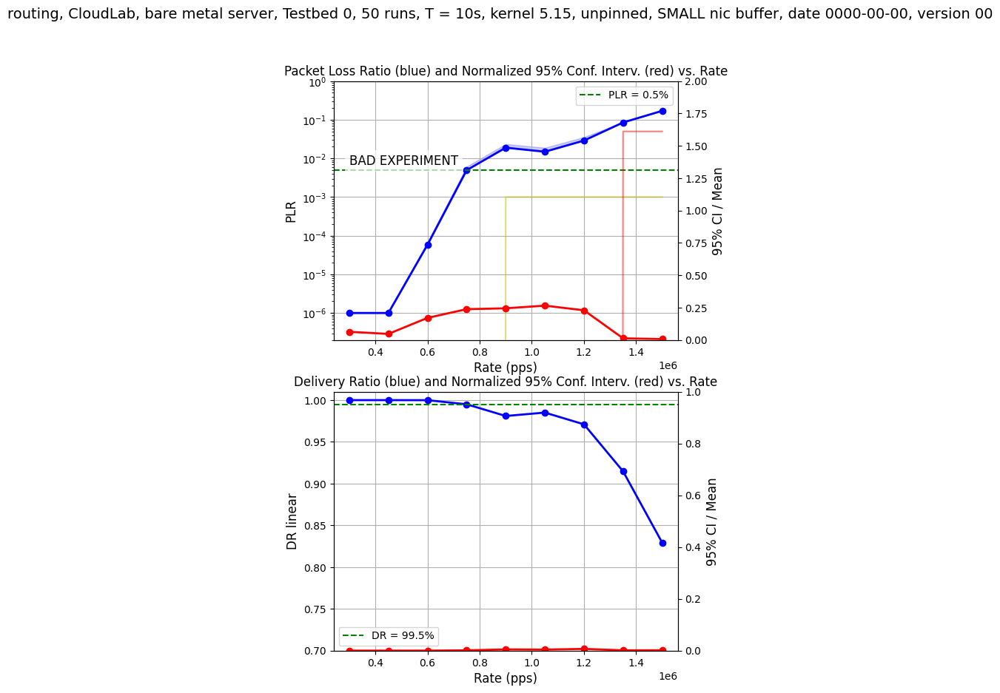

['routing, CloudLab, bare metal server, Testbed 0, 50 runs, T = 10s, kernel 5.15, unpinned, SMALL nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/clab_raw_50_k5.15_intel_bare-metal_as-is_2nd_exec.txt', [300000, 450000, 600000, 750000, 900000, 1050000, 1200000, 1350000, 1500000], [0.6703100243026415, 0.6149452585741151, 0.6988021011280171, 0.9251277912850552, 0.8342378377248334, 0.8349871585546703, 0.6582518687981908, 0.10480595900082658, 0.014626171842376919], [1e-06, 1e-06, 0.0005310304425253753, 0.008591644957771982, 0.022167225517649193, 0.014755215644347328, 0.01777092462334758, 0.09258977667433509, 0.18272106704767896], [2.413117696148856e-07, 1.448538042019335e-07, 0.0003719004587970372, 0.007949232976124435, 0.018493387134844653, 0.012320972242999747, 0.0116981283241991, 0.009704014681973377, 0.0026725165513895766], [0.24131176961488562, 0.14485380420193353, 0.7003373611283422, 0.9252282904141165, 0.8342671084444244, 0.8350248847579445, 0.6582734760368072, 0.1048065

<Figure size 800x2000 with 0 Axes>

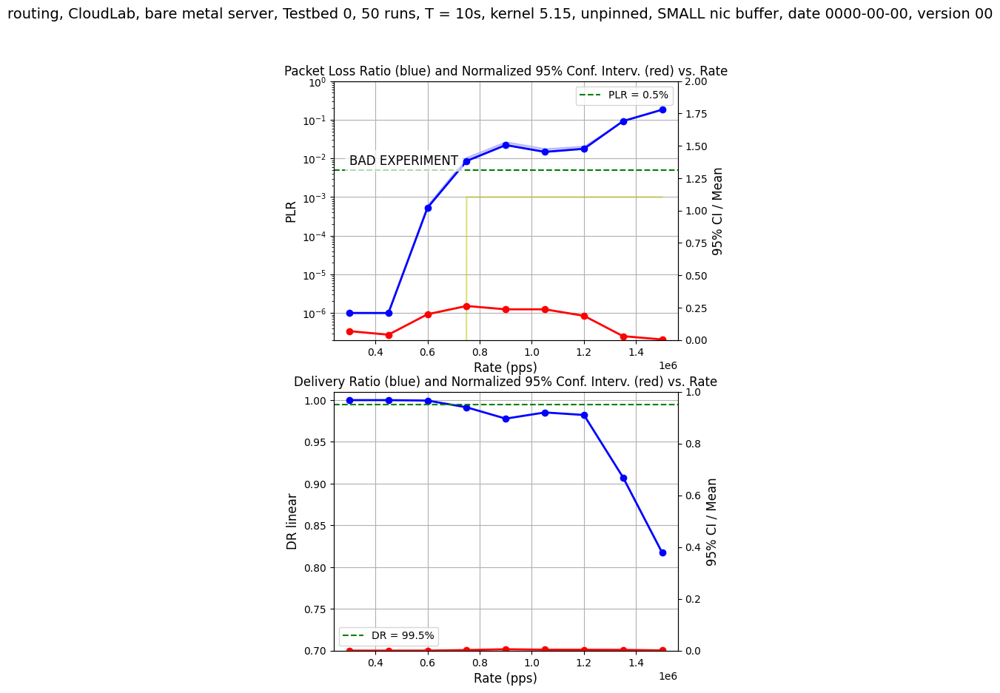

['routing, CloudLab, bare metal server, Testbed 0, 50 runs, T = 10s, kernel 5.15, unpinned, LARGE nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/clab_raw_50_k5.15_intel_bare-metal_nic_buf_4096.txt', [300000, 450000, 600000, 750000, 900000, 1050000, 1200000, 1350000, 1500000], [0.6413165862232925, 0.6718142450899716, 0.6415116241231813, 0.7524654072021624, 0.8447727598050506, 0.8198047328230514, 0.47090315295352986, 0.05587871376862244, 0.03545123961770859], [1e-06, 1e-06, 1e-06, 0.002783048742146328, 0.014983794469653047, 0.011039949820938049, 0.03222627287408347, 0.06660972086532631, 0.1570174696844182], [2.3942501846798613e-07, 1.5526377113494693e-07, 1.0905706699499719e-07, 0.00209485020625661, 0.01265855845093824, 0.00905114964997872, 0.01517572819810441, 0.0037220945006515268, 0.0055664804858141115], [0.23942501846798614, 0.15526377113494694, 0.10905706699499719, 0.752717756801137, 0.8448166101434353, 0.8198542381789247, 0.4709116768606774, 0.05587914875333254, 0.035

<Figure size 800x2000 with 0 Axes>

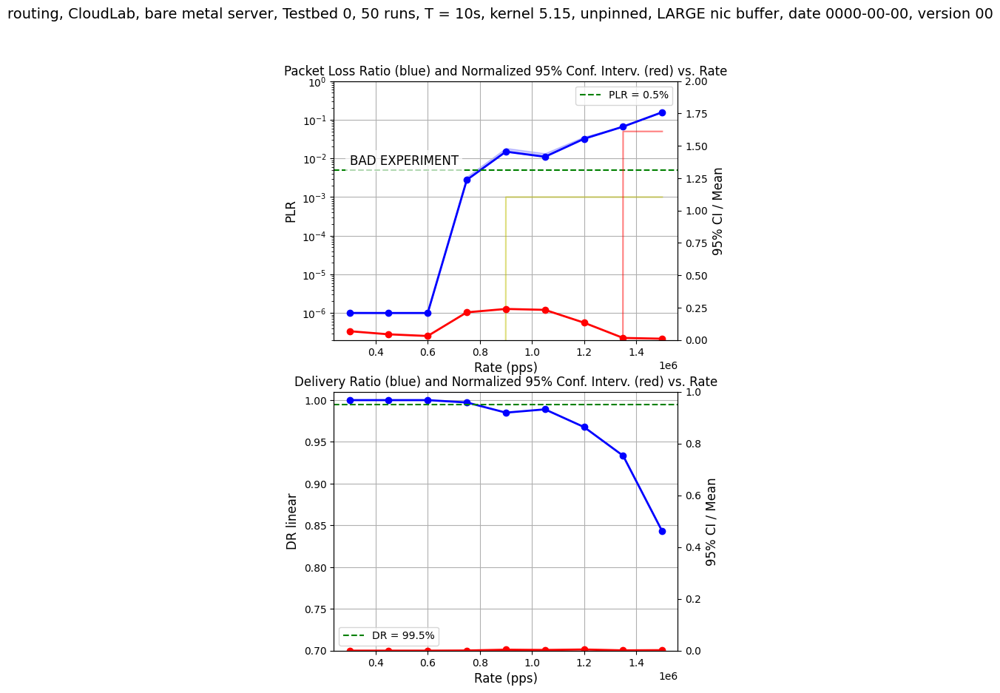

['routing, CloudLab, bare metal server, Testbed 0, 50 runs, T = 10s, kernel 5.15, pin-1cpu, LARGE nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/clab_raw_50_k5.15_intel_bare-metal_nic_buf_4096_irq_pf0-4_pf1-4.txt', [300000, 450000, 600000, 750000, 900000, 1050000, 1200000, 1350000, 1500000], [0.6365934967152752, 0.5600637346964322, 0.6141629451049047, 0.6873401120898995, 0.688291444337854, 0.5254055077545261, 0.7600695654228317, 0.17802755643505108, 0.0491587666633318], [1e-06, 1e-06, 1e-06, 0.005658588175623511, 0.012682966937606985, 0.03314749328023617, 0.019985694986887067, 0.022535435076119797, 0.12152123174055113], [2.461496494922596e-07, 1.3939367161191212e-07, 1.1669105681739059e-07, 0.0038900161485126723, 0.008730112968932053, 0.017416225808130813, 0.015190961877676105, 0.004012020750585449, 0.005973856816467963], [0.24614964949225962, 0.13939367161191213, 0.1166910568173906, 0.687453482702695, 0.6883336534644665, 0.5254160747809865, 0.7600917500063489, 0.17803165

<Figure size 800x2000 with 0 Axes>

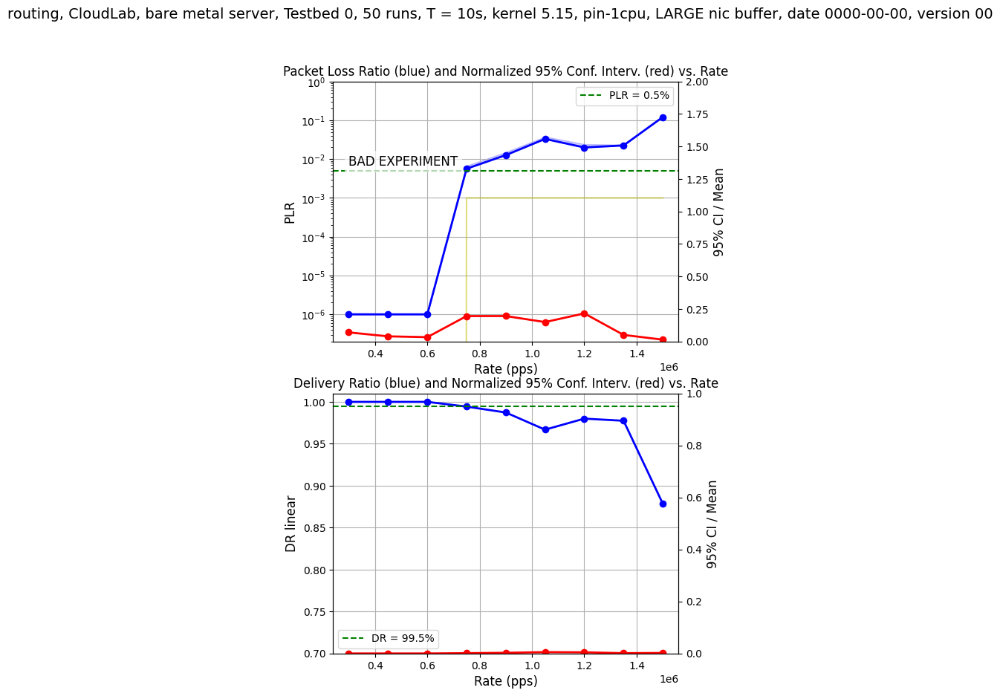

['routing, CloudLab, bare metal server, Testbed 0, 50 runs, T = 10s, kernel 5.15, pin-2cpu, LARGE nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/clab_raw_50_k5.15_intel_bare-metal_nic_buf_4096_irq_pf0-4_pf1-6.txt', [300000, 450000, 600000, 750000, 900000, 1050000, 1200000, 1350000, 1500000], [0.6703100243026415, 0.5880120219569751, 0.6436785746347322, 0.949789335433562, 0.7999191322682462, 0.8473693864843953, 0.49508867035486637, 0.12827530046280186, 0.04998220967643422], [1e-06, 1e-06, 1e-06, 0.0025331900088506674, 0.015140652003430212, 0.012605641696850012, 0.03328015717347741, 0.059379929038366065, 0.16934031651378043], [2.413117696148856e-07, 1.4373630397206176e-07, 1.1586223999546167e-07, 0.0024068833253160153, 0.012111919370916682, 0.01068219978398763, 0.01647691756620701, 0.007617044752117902, 0.008464026531631386], [0.24131176961488562, 0.14373630397206177, 0.11586223999546168, 0.9501392777117581, 0.7999602241814057, 0.8474142007905059, 0.495097348258267, 0.128276

<Figure size 800x2000 with 0 Axes>

KeyboardInterrupt: 

In [ ]:
# GENERATES THE GRAPHS WITH THE STEP FUNCTIONS
# prompt: create a bar chart with x-axis rate_list and y-axis drop_pkt_mean_list

import matplotlib.pyplot as plt
import math

ADD_SUBTITLE = True
VALUE_FOR_SATURATION_IN_PLR = 0.05
VALUE_FOR_PDR_IN_PLR = 0.001


def t_distribution(k):
  if k == 50: return 2.009
  if k == 40: return 2.021
  if k == 30: return 2.042
  if k == 25: return 2.060
  if k == 20: return 2.086
  raise ValueError("k must be 20, 25, 30, 40 or 50")


def t_distribution_array(np_array):
  return_list=[]
  for i in range(len(np_array)):
    return_list.append(t_distribution(np_array[i]))
  return np.array(return_list)

for exp in exp_data_filtered:
  print(exp)
  suptitle = exp[0]
  name_exp=exp[1]
  rate_list=exp[2]
  cv_drop_pkt_list=exp[3]  #THIS WILL NOT BE USED

  drop_ratio_mean_list=exp[4]
  drop_ratio_std_list=exp[5]
  cv_drop_ratio_list=exp[6]

  delivery_ratio_mean_list=exp[7]
  delivery_ratio_std_list=exp[8]
  cv_delivery_ratio_list=exp[9]
  num_of_experiments_list=exp[10]
  step_function_PDR_list=exp[11]
  step_function_saturation_list=exp[12]
  good_or_bad=exp[13]

  #print(name_exp)
  #print(rate_list)
  #print(cv_delivery_ratio_list)
  #print(drop_ratio_std_list)

  np_drop_ratio_mean=np.array(drop_ratio_mean_list)
  np_drop_ratio_std=np.array(drop_ratio_std_list)
  np_drop_ratio_cv=np.array(cv_drop_ratio_list)
  np_num_of_experiments=np.array(num_of_experiments_list)

  #np_drop_ratio_normalized_conf_interval=np_drop_ratio_cv*(1/math.sqrt(NUM_OF_EXPERIMENTS))*t_distribution(NUM_OF_EXPERIMENTS)
  #np_drop_ratio_normalized_conf_interval=np_drop_ratio_cv/np.sqrt(np_num_of_experiments)

  np_drop_ratio_normalized_conf_interval=np_drop_ratio_cv/np.sqrt(np_num_of_experiments)*t_distribution_array(np_num_of_experiments)

  #np_bottom=np_mean-np_std*1.96
  #np_top=np.maximum(np_mean+np_std*1.96, 10e-6)
  np_drop_ratio_top=np_drop_ratio_mean+np_drop_ratio_std/np.sqrt(np_num_of_experiments)*t_distribution_array(np_num_of_experiments)

  CV_DROP_CAP = 2
  #tweak the cv_drop to cap at CV_DROP_CAP
  np_drop_ratio_normalized_conf_interval = [min(x, CV_DROP_CAP) for x in np_drop_ratio_normalized_conf_interval] # cap at CV_DROP_CAP

  np_delivery_ratio_mean=np.array(delivery_ratio_mean_list)
  np_delivery_ratio_std=np.array(delivery_ratio_std_list)
  np_delivery_ratio_cv=np.array(cv_delivery_ratio_list)

  #np_cv_dr=np.array(cv_delivery_ratio_list)
  #np_cv_top=np_cv_dr*(1/math.sqrt(NUM_OF_EXPERIMENTS))*1.96
  np_delivery_ratio_normalized_conf_interval=np_delivery_ratio_cv/np.sqrt(np_num_of_experiments)*t_distribution_array(np_num_of_experiments)
  #print(np_bottom)
  #print(np_top)

  CV_DROP_CAP = 2
  #tweak the cv_drop to cap at CV_DROP_CAP
  np_delivery_ratio_normalized_conf_interval = [min(x, CV_DROP_CAP) for x in np_delivery_ratio_normalized_conf_interval] # cap at CV_DROP_CAP



  # Create the plot
  plt.figure(figsize=(8, 20))

  fig, (ax1, bx1) = plt.subplots(2, 1, figsize=(6, 10))
  ax2 = ax1.twinx()

  ax1.semilogy(rate_list, drop_ratio_mean_list, marker='o', color='b',
  linestyle='-', linewidth=2, markersize=6)
  ax1.fill_between(rate_list, np_drop_ratio_mean, np_drop_ratio_top, color='b', alpha=0.2)

  ax2.plot(rate_list, np_drop_ratio_normalized_conf_interval, marker='o', color='r',
  linestyle='-', linewidth=2, markersize=6)

  #plt.errorbar(rate_list, drop_ratio_mean_list, yerr=drop_ratio_std_list, marker='o', color='b',
  #linestyle='-', linewidth=2, markersize=6)

  # Add horizontal line at y=0.5*10e-2
  ax1.axhline(y=0.5 * 1e-2, color='green', linestyle='--', linewidth=1.5, label='PLR = 0.5%')
  print (f"step_function_PDR_list: {step_function_PDR_list}")
  print (f"step_function_saturation_list: {step_function_saturation_list}")

  ax1.plot(rate_list, np.array(step_function_PDR_list) * VALUE_FOR_PDR_IN_PLR, color='y', alpha=0.5)

  #find the index of the first non zero element in step_function_saturation
  my_index = -1
  for i in range(len(step_function_saturation_list)):
    if step_function_saturation_list[i] != 0:
      my_index = i
      break
  if my_index == len(step_function_saturation_list)-1 or my_index == -1:
    pass
  else:
    ax1.plot(rate_list, np.array(step_function_saturation_list) * VALUE_FOR_SATURATION_IN_PLR, color='r', alpha=0.5)


  # Add the "GOOD EXPERIMENT" label at specific coordinates
  # Adjust the x and y values based on where you want the label to appear
  if good_or_bad:
    ax1.text(x=rate_list[0], y=0.8 * 1e-2, s='GOOD EXPERIMENT', fontsize=12, color='black',
            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
  else:
    ax1.text(x=rate_list[0], y=0.7 * 1e-2, s='BAD EXPERIMENT', fontsize=12, color='black',
            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))


  # Add titles and labels
  # plt.title("Packet Loss Ratio (blue) and Normalized 95% Conf. Interv. (red) vs. Rate", fontsize=12)
  if ADD_SUBTITLE:
    plt.suptitle(suptitle, fontsize=14)

  ax1.title.set_text("Packet Loss Ratio (blue) and Normalized 95% Conf. Interv. (red) vs. Rate")
  ax1.set_xlabel("Rate (pps)", fontsize=12)
  ax1.set_ylabel("PLR", fontsize=12)
  ax2.set_ylabel("95% CI / Mean", fontsize=12)
  ax1.set_ylim(20e-8, 10e-1)  #range from 2*10e-8 to 10e-1
  ax2.set_ylim(0, CV_DROP_CAP)       #range from 0 to 1.0
  ax1.grid(True)
  #ax2.grid(True)

  # Add legend for the horizontal line
  ax1.legend(loc='best')

  #######################
  #Plot Delivery Ratio Linear
  bx2 = bx1.twinx()
  bx1.plot(rate_list, delivery_ratio_mean_list, marker='o', color='b',
  linestyle='-', linewidth=2, markersize=6)
  #bx1.fill_between(rate_list, np_mean, np_top, color='b', alpha=0.2)

  bx2.plot(rate_list, np_delivery_ratio_normalized_conf_interval, marker='o', color='r',
  linestyle='-', linewidth=2, markersize=6)

  # Add horizontal line at y=99.5*10e-2
  bx1.axhline(y=99.5 * 1e-2, color='green', linestyle='--', linewidth=1.5, label='DR = 99.5%')

  bx1.title.set_text("Delivery Ratio (blue) and Normalized 95% Conf. Interv. (red) vs. Rate")
  bx1.set_xlabel("Rate (pps)", fontsize=12)
  bx1.set_ylabel("DR linear", fontsize=12)
  bx2.set_ylabel("95% CI / Mean", fontsize=12)
  bx1.set_ylim(0.7, 1.01)  #range from 2*10e-8 to 10e-1
  bx2.set_ylim(0, 1.0)       #range from 0 to 1.0
  bx1.grid(True)
  #ax2.grid(True)

  # Add legend for the horizontal line
  bx1.legend(loc='best')

  # Show the plot
  plt.show()

In [ ]:
# GENERATES AND SAVE TO FILE THE GRAPHS WITH THE STEP FUNCTIONS
# prompt: create a bar chart with x-axis rate_list and y-axis drop_pkt_mean_list

import matplotlib.pyplot as plt
import math

ADD_SUBTITLE = False
VALUE_FOR_SATURATION_IN_PLR = 0.05
VALUE_FOR_PDR_IN_PLR = 0.001

latex_string = ""

# Specify the directory name
directory_name = "graphs"

# Create the directory
try:
    os.mkdir(directory_name)
    print(f"Directory '{directory_name}' created successfully.")
except FileExistsError:
    print(f"Directory '{directory_name}' already exists.")
except PermissionError:
    print(f"Permission denied: Unable to create '{directory_name}'.")
except Exception as e:
    print(f"An error occurred: {e}")

def t_distribution(k):
  if k == 50: return 2.009
  if k == 40: return 2.021
  if k == 30: return 2.042
  if k == 25: return 2.060
  if k == 20: return 2.086
  raise ValueError("k must be 20, 25, 30, 40 or 50")


def t_distribution_array(np_array):
  return_list=[]
  for i in range(len(np_array)):
    return_list.append(t_distribution(np_array[i]))
  return np.array(return_list)

for exp in exp_data_filtered:
  print(exp)
  suptitle = exp[0]
  name_exp=exp[1]
  rate_list=exp[2]
  cv_drop_pkt_list=exp[3]  #THIS WILL NOT BE USED

  drop_ratio_mean_list=exp[4]
  drop_ratio_std_list=exp[5]
  cv_drop_ratio_list=exp[6]

  delivery_ratio_mean_list=exp[7]
  delivery_ratio_std_list=exp[8]
  cv_delivery_ratio_list=exp[9]
  num_of_experiments_list=exp[10]
  step_function_PDR_list=exp[11]
  step_function_saturation_list=exp[12]
  good_or_bad=exp[13]

  #print(name_exp)
  #print(rate_list)
  #print(cv_delivery_ratio_list)
  #print(drop_ratio_std_list)

  np_drop_ratio_mean=np.array(drop_ratio_mean_list)
  np_drop_ratio_std=np.array(drop_ratio_std_list)
  np_drop_ratio_cv=np.array(cv_drop_ratio_list)
  np_num_of_experiments=np.array(num_of_experiments_list)

  #np_drop_ratio_normalized_conf_interval=np_drop_ratio_cv*(1/math.sqrt(NUM_OF_EXPERIMENTS))*t_distribution(NUM_OF_EXPERIMENTS)
  #np_drop_ratio_normalized_conf_interval=np_drop_ratio_cv/np.sqrt(np_num_of_experiments)

  np_drop_ratio_normalized_conf_interval=np_drop_ratio_cv/np.sqrt(np_num_of_experiments)*t_distribution_array(np_num_of_experiments)

  #np_bottom=np_mean-np_std*1.96
  #np_top=np.maximum(np_mean+np_std*1.96, 10e-6)
  np_drop_ratio_top=np_drop_ratio_mean+np_drop_ratio_std/np.sqrt(np_num_of_experiments)*t_distribution_array(np_num_of_experiments)

  CV_DROP_CAP = 2
  #tweak the cv_drop to cap at CV_DROP_CAP
  np_drop_ratio_normalized_conf_interval = [min(x, CV_DROP_CAP) for x in np_drop_ratio_normalized_conf_interval] # cap at CV_DROP_CAP

  np_delivery_ratio_mean=np.array(delivery_ratio_mean_list)
  np_delivery_ratio_std=np.array(delivery_ratio_std_list)
  np_delivery_ratio_cv=np.array(cv_delivery_ratio_list)

  #np_cv_dr=np.array(cv_delivery_ratio_list)
  #np_cv_top=np_cv_dr*(1/math.sqrt(NUM_OF_EXPERIMENTS))*1.96
  np_delivery_ratio_normalized_conf_interval=np_delivery_ratio_cv/np.sqrt(np_num_of_experiments)*t_distribution_array(np_num_of_experiments)
  #print(np_bottom)
  #print(np_top)

  CV_DROP_CAP = 2
  #tweak the cv_drop to cap at CV_DROP_CAP
  np_delivery_ratio_normalized_conf_interval = [min(x, CV_DROP_CAP) for x in np_delivery_ratio_normalized_conf_interval] # cap at CV_DROP_CAP



  # Create the plot
  fig0 = plt.figure(figsize=(8, 20))

  fig, (ax1, bx1) = plt.subplots(2, 1, figsize=(6, 10))
  ax2 = ax1.twinx()

  ax1.semilogy(rate_list, drop_ratio_mean_list, marker='o', color='b',
  linestyle='-', linewidth=2, markersize=6)
  ax1.fill_between(rate_list, np_drop_ratio_mean, np_drop_ratio_top, color='b', alpha=0.2)

  ax2.plot(rate_list, np_drop_ratio_normalized_conf_interval, marker='o', color='r',
  linestyle='-', linewidth=2, markersize=6)

  #plt.errorbar(rate_list, drop_ratio_mean_list, yerr=drop_ratio_std_list, marker='o', color='b',
  #linestyle='-', linewidth=2, markersize=6)

  # Add horizontal line at y=0.5*10e-2
  ax1.axhline(y=0.5 * 1e-2, color='green', linestyle='--', linewidth=1.5, label='PLR = 0.5%')
  print (f"step_function_PDR_list: {step_function_PDR_list}")
  print (f"step_function_saturation_list: {step_function_saturation_list}")

  ax1.plot(rate_list, np.array(step_function_PDR_list) * VALUE_FOR_PDR_IN_PLR, color='y', alpha=0.5)

  #find the index of the first non zero element in step_function_saturation
  my_index = -1
  for i in range(len(step_function_saturation_list)):
    if step_function_saturation_list[i] != 0:
      my_index = i
      break
  if my_index == len(step_function_saturation_list)-1 or my_index == -1:
    pass
  else:
    ax1.plot(rate_list, np.array(step_function_saturation_list) * VALUE_FOR_SATURATION_IN_PLR, color='r', alpha=0.5)


  # Add the "GOOD EXPERIMENT" label at specific coordinates
  # Adjust the x and y values based on where you want the label to appear
  if good_or_bad:
    ax1.text(x=rate_list[0], y=0.8 * 1e-2, s='GOOD EXPERIMENT', fontsize=12, color='black',
            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
  else:
    ax1.text(x=rate_list[0], y=0.7 * 1e-2, s='BAD EXPERIMENT', fontsize=12, color='black',
            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))


  # Add titles and labels
  # plt.title("Packet Loss Ratio (blue) and Normalized 95% Conf. Interv. (red) vs. Rate", fontsize=12)
  if ADD_SUBTITLE:
    plt.suptitle(suptitle, fontsize=14)

  ax1.title.set_text("Packet Loss Ratio (blue) and Normalized 95% Conf. Interv. (red) vs. Rate")
  ax1.set_xlabel("Rate (pps)", fontsize=12)
  ax1.set_ylabel("PLR", fontsize=12)
  ax2.set_ylabel("95% CI / Mean", fontsize=12)
  ax1.set_ylim(20e-8, 10e-1)  #range from 2*10e-8 to 10e-1
  ax2.set_ylim(0, CV_DROP_CAP)       #range from 0 to 1.0
  ax1.grid(True)
  #ax2.grid(True)

  # Add legend for the horizontal line
  ax1.legend(loc='best')

  #######################
  #Plot Delivery Ratio Linear
  bx2 = bx1.twinx()
  bx1.plot(rate_list, delivery_ratio_mean_list, marker='o', color='b',
  linestyle='-', linewidth=2, markersize=6)
  #bx1.fill_between(rate_list, np_mean, np_top, color='b', alpha=0.2)

  bx2.plot(rate_list, np_delivery_ratio_normalized_conf_interval, marker='o', color='r',
  linestyle='-', linewidth=2, markersize=6)

  # Add horizontal line at y=99.5*10e-2
  bx1.axhline(y=99.5 * 1e-2, color='green', linestyle='--', linewidth=1.5, label='DR = 99.5%')

  bx1.title.set_text("Delivery Ratio (blue) and Normalized 95% Conf. Interv. (red) vs. Rate")
  bx1.set_xlabel("Rate (pps)", fontsize=12)
  bx1.set_ylabel("DR linear", fontsize=12)
  bx2.set_ylabel("95% CI / Mean", fontsize=12)
  bx1.set_ylim(0.7, 1.01)  #range from 2*10e-8 to 10e-1
  bx2.set_ylim(0, 1.0)       #range from 0 to 1.0
  bx1.grid(True)
  #ax2.grid(True)

  # Add legend for the horizontal line
  bx1.legend(loc='best')

#  # Show the plot
#  plt.show()

  filename = name_exp.split("/")[-1][:-4]
  plt.savefig("graphs/" + filename + ".png", dpi=fig0.dpi, bbox_inches="tight")
  plt.close()

  latex_string = latex_string + """\
\\begin{{figure}}[ht!]
    \\centering
    \\includegraphics[width=\\linewidth]{{fig/graphs/{filename1}.png}}
    \\caption{{{suptitle1}}}
    \\label{{fig:{filename1}}}
\\end{{figure}}\n\n""".format(filename1=filename, suptitle1=suptitle)

if DEBUG:
  print("\n\n" + latex_string)

# Open the file in write mode
with open("graphs/_latex-include.tex", 'w') as file:
    file.write(latex_string)

print(f'LaTeX code written to graphs/_latex-include.tex')


Directory 'graphs' created successfully.
['ebpf, CloudLab, bare metal server, Testbed 1, 30 runs, T = 10s, kernel 5.15, unpinned, SMALL nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/ebpf_30/clab_tb1_class_ebpf_raw_30_exp_t_10_k5.15_intel_bare-metal_as-is.txt', [4000000, 4400000, 4800000, 5200000, 5600000, 6000000, 6400000, 6800000, 7200000, 7600000, 8000000, 8400000, 8800000, 9200000, 9600000, 10000000], [0.7610358577788202, 0.4651897508684348, 0.6168884365560753, 0.43498025505033727, 0.7332641734824877, 0.795162615355242, 0.8698462545765484, 0.9698644506633611, 0.13268153320581957, 0.052066289965500764, 0.05843406369467348, 0.16737792536287827, 0.21007580808941131, 0.9717511211334702, 0.4337087398933696, 0.12471491288740764], [0.00043788500000000824, 0.0014419726617285152, 0.0012937812769537797, 0.0014417646881372556, 0.001200329123797772, 0.0013474215768385588, 0.0013939777784138907, 0.0011862326163575001, 0.010049820826413773, 0.038067724187635814, 0.05378577839462606

<ipython-input-11-86ddae356485>:103: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, bx1) = plt.subplots(2, 1, figsize=(6, 10))


['routing, CloudLab, bare metal server, Testbed 0, 50 runs, T = 10s, kernel 6.8, unpinned, SMALL nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/clab_raw_50_k6.8_intel_bare-metal_as-is_3rd_exec.txt', [300000, 450000, 600000, 750000, 900000, 1050000, 1200000, 1350000, 1500000], [4.701783972913947, 0.6159905182079817, 0.13217783371721264, 0.021695290701474277, 0.00958898914873419, 0.00560135867579172, 0.005189118968441122, 0.0042566311938343915, 0.0031797030955661677], [1e-06, 0.0023894449754322156, 0.04575158145965122, 0.23405811041549612, 0.362363554101138, 0.45233127780893656, 0.5214984397069031, 0.575028613024428, 0.6177315743515919], [4.952549086508573e-06, 0.0014728336563316568, 0.006047499134074455, 0.005077978995445343, 0.003474707646263638, 0.0025336734615272185, 0.002706120472484393, 0.002447686938693942, 0.001964204483052008], [4.952549086508573, 0.616391535053132, 0.1321812042586507, 0.021695377213936308, 0.009589009730525561, 0.005601366931334417, 0.005189124772

<ipython-input-11-86ddae356485>:101: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig0 = plt.figure(figsize=(8, 20))


['routing, CloudLab, bare metal server, Testbed 0, 50 runs, T = 10s, kernel 6.8, unpinned, SMALL nic buffer, date 0000-00-00, version 00', 'misure/bare-metal/clab_raw_50_k6.8_intel_bare-metal_as-is_4th_exec_after-reboot.txt', [300000, 450000, 600000, 750000, 900000, 1050000, 1200000, 1350000, 1500000], [4.459692914781454, 3.5440520104679334, 0.1514389790500101, 0.019227253386597774, 0.00975953738577584, 0.006091870740184697, 0.005133413433984545, 0.004244328518708122, 0.0035480773248668667], [1e-06, 0.0034797029954895596, 0.046477428731190616, 0.24005862401563305, 0.3678714655332759, 0.45917829690808476, 0.5257252569148188, 0.5800009911132402, 0.6216451780601681], [4.013726299121319e-06, 0.012337761368015213, 0.00703867103487724, 0.004615685937027864, 0.0035902629117716485, 0.002797258892710528, 0.002698768090925426, 0.002461716948228571, 0.0022056468161528934], [4.013726299121319, 3.5456363327581677, 0.1514427804426635, 0.019227328141009765, 0.009759558019992422, 0.00609187958478461, 

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

<Figure size 800x2000 with 0 Axes>

In [ ]:
# prompt: vorrei fare un file zip della cartella graphs

from google.colab import files
import os
import zipfile

def zip_folder(folder_path, zip_filename):
  """Creates a zip archive of a folder."""
  with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for root, _, files in os.walk(folder_path):
      for file in files:
        file_path = os.path.join(root, file)
        zipf.write(file_path, os.path.relpath(file_path, folder_path))

# Specify the folder you want to zip and the zip file name
folder_to_zip = "graphs"
zip_file_name = "graphs.zip"

# Create the zip archive
zip_folder(folder_to_zip, zip_file_name)

# Download the zip file
files.download(zip_file_name)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
for my_CLASS_LIST in CLASS_LIST:
  generate_latex_section(my_CLASS_LIST)

  for my_KERNEL_LIST in KERNEL_LIST:
    generate_latex_subsection(my_KERNEL_LIST)

    for my_CPU_PINNING_LIST in CPU_PINNING_LIST:
      generate_latex_subusubsections(my_CPU_PINNING_LIST)

      for exp in exp_data_filtered:
        #filter
        if exp[0].split(', ')[] == my_CLASS_LIST and ...


